# 02 - Closed-loop MPC benchmark

This notebook tests the main control claim: physics-informed SINDy-MPC should improve closed-loop tracking and constraint handling relative to rule-based control and raw-feature SINDy-MPC. It uses the final objective: temperature, CO2, humidity and energy proxy.

In [1]:
from pathlib import Path
import sys

HERE = Path.cwd().resolve()
if (HERE / 'article_experiment_utils.py').exists():
    ARTICLE_DIR = HERE
    REPO_DIR = HERE.parent
else:
    ARTICLE_DIR = HERE / 'own-article'
    REPO_DIR = HERE
sys.path.insert(0, str(ARTICLE_DIR))
sys.path.insert(0, str(REPO_DIR))

from article_experiment_utils import *
OUT = results_dir()

In [2]:
FAST_MODE = False
cfg = ExperimentConfig(n_days=7 if FAST_MODE else 60, start_date='2010-02-28', horizon=20)
rollout_days = 1 if FAST_MODE else 14
benchmark_start_date = '2010-04-15'

train_path = OUT / 'datasets' / ('rbc_train_fast.npz' if FAST_MODE else 'rbc_train_60d.npz')
train_data = load_dataset(train_path) if train_path.exists() else collect_rule_based_dataset(cfg)
save_dataset(train_data, train_path)

train_budget_days = 7 if FAST_MODE else 60
train_subset = train_data.subset_steps(train_budget_days * cfg.steps_per_day)
train_budget_days, rollout_days

(60, 14)

In [3]:
raw_bundle = fit_sindy(
    train_subset,
    feature_variant='raw',
    library_degree=1,
    period=float(cfg.period),
    metadata={'label': 'raw_sindy_mpc'},
)
pi_bundle = fit_sindy(
    train_subset,
    feature_variant='physics',
    library_degree=1,
    period=float(cfg.period),
    metadata={'label': 'physics_sindy_mpc'},
)

save_bundle(raw_bundle, OUT / 'models' / ('raw_sindy_mpc_fast.pkl' if FAST_MODE else 'raw_sindy_mpc.pkl'))
save_bundle(pi_bundle, OUT / 'models' / ('physics_sindy_mpc_fast.pkl' if FAST_MODE else 'physics_sindy_mpc.pkl'))

raw_bundle.condition_number, pi_bundle.condition_number

C:\Users\zergu\.cache\codex-runtimes\codex-primary-runtime\dependencies\python\Lib\site-packages\pysindy\__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound


(8.09026824543052, 78.78995449639699)

In [4]:
rollouts = {}
rollouts['rule_based'] = rollout_rule_based(
    cfg, n_days=rollout_days, start_date=benchmark_start_date, noise_scale=0.0
)
rollouts['raw_sindy_mpc'] = rollout_mpc(
    raw_bundle, cfg, n_days=rollout_days, start_date=benchmark_start_date, objective='full'
)
rollouts['physics_sindy_mpc'] = rollout_mpc(
    pi_bundle, cfg, n_days=rollout_days, start_date=benchmark_start_date, objective='full'
)

dagger_path = OUT / 'models' / ('dagger_iter_1_fast.pkl' if FAST_MODE else 'dagger_iter_3.pkl')
if dagger_path.exists():
    dagger_bundle = load_bundle(dagger_path)
    rollouts['physics_sindy_mpc_dagger'] = rollout_mpc(
        dagger_bundle, cfg, n_days=rollout_days, start_date=benchmark_start_date, objective='full'
    )

for name, df in rollouts.items():
    save_table(df, OUT / 'tables' / f'closed_loop_rollout_{name}_{"fast" if FAST_MODE else "paper"}.csv')

{name: len(df) for name, df in rollouts.items()}


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality c

  12  1.2243756e+02 2.27e-13 3.30e-05  -8.6 4.15e-04    -  1.00e+00 9.90e-01f  1
  13  1.2243755e+02 1.14e-13 6.04e-14  -8.6 9.31e-05    -  1.00e+00 1.00e+00f  1
  14  1.2243755e+02 1.14e-13 5.68e-14  -8.6 5.03e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.2243755320813901e+02    1.2243755320813901e+02
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8747048220316968e-09    9.8747048220316968e-09
Complementarity.........:   2.6438608577741142e-09    2.6438608577741142e-09
Overall NLP error.......:   2.6438608577741142e-09    2.6438608577741142e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequal

   4  3.1900148e+02 1.14e-13 2.84e-14  -1.7 7.92e-01    -  1.00e+00 1.00e+00f  1
   5  3.1742426e+02 1.14e-13 2.84e-14  -2.5 1.92e-01    -  1.00e+00 1.00e+00f  1
   6  3.1718166e+02 1.14e-13 6.11e-02  -3.8 5.22e-02    -  9.18e-01 1.00e+00f  1
   7  3.1717658e+02 1.14e-13 3.71e-04  -3.8 1.14e-02    -  9.98e-01 1.00e+00f  1
   8  3.1716290e+02 1.14e-13 3.28e-03  -5.7 4.79e-03    -  9.61e-01 1.00e+00f  1
   9  3.1716274e+02 1.14e-13 2.84e-14  -5.7 8.57e-04    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.1716258e+02 1.14e-13 2.84e-14  -8.6 6.32e-05    -  1.00e+00 1.00e+00f  1
  11  3.1716258e+02 1.14e-13 1.42e-14  -9.0 2.06e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.1716257550928441e+02    3.1716257550928441e+02
Dual infeasibility......:   1.4210854715202004e-14    1.4210854715202004e-14
Constraint viol

  11  2.4205891e+02 1.14e-13 2.84e-14  -5.7 9.39e-04    -  1.00e+00 1.00e+00f  1
  12  2.4205876e+02 1.14e-13 6.77e-06  -8.6 1.56e-04    -  1.00e+00 9.93e-01f  1
  13  2.4205876e+02 1.14e-13 1.82e-14  -8.6 5.49e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.4205876229949985e+02    2.4205876229949985e+02
Dual infeasibility......:   1.8232655096676100e-14    1.8232655096676100e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9763875494041088e-09    9.9763875494041088e-09
Complementarity.........:   2.5848699078039606e-09    2.5848699078039606e-09
Overall NLP error.......:   2.5848699078039606e-09    2.5848699078039606e-09


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequal

   7  3.6148592e+02 1.14e-13 8.44e-03  -3.8 5.77e-01    -  9.15e-01 8.92e-01f  1
   8  3.6146766e+02 1.14e-13 2.47e-02  -3.8 2.48e-01    -  1.00e+00 8.71e-01f  1
   9  3.6146505e+02 1.14e-13 2.80e-14  -3.8 8.68e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.6145770e+02 1.14e-13 4.49e-03  -5.7 5.67e-02    -  1.00e+00 9.12e-01f  1
  11  3.6145699e+02 1.14e-13 3.38e-14  -5.7 1.02e-02    -  1.00e+00 1.00e+00f  1
  12  3.6145689e+02 1.14e-13 2.54e-05  -8.6 1.04e-03    -  1.00e+00 9.95e-01f  1
  13  3.6145689e+02 1.14e-13 4.09e-14  -8.6 3.00e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   3.6145688790913158e+02    3.6145688790913158e+02
Dual infeasibility......:   4.0856207306205761e-14    4.0856207306205761e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

   4  4.5867938e+02 1.14e-13 4.97e-14  -1.0 8.08e+00    -  1.00e+00 1.00e+00f  1
   5  4.5256854e+02 1.14e-13 3.20e-14  -1.7 4.00e+00    -  1.00e+00 1.00e+00f  1
   6  4.5106925e+02 1.14e-13 3.20e-14  -2.5 2.26e+00    -  1.00e+00 1.00e+00f  1
   7  4.5101691e+02 1.14e-13 2.84e-14  -2.5 1.11e+00    -  1.00e+00 1.00e+00f  1
   8  4.5080240e+02 1.14e-13 2.84e-14  -3.8 6.48e-01    -  1.00e+00 1.00e+00f  1
   9  4.5079955e+02 1.14e-13 3.91e-14  -3.8 2.66e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.5078765e+02 1.14e-13 3.91e-14  -5.7 9.74e-02    -  1.00e+00 1.00e+00f  1
  11  4.5078758e+02 1.14e-13 2.78e-14  -5.7 1.48e-02    -  1.00e+00 1.00e+00f  1
  12  4.5078744e+02 2.27e-13 7.46e-14  -8.6 1.10e-03    -  1.00e+00 1.00e+00f  1
  13  4.5078744e+02 1.14e-13 7.82e-14  -9.0 4.19e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objecti

  13  4.9636984e+02 1.14e-13 5.68e-14  -8.6 2.42e-03    -  1.00e+00 1.00e+00h  1
  14  4.9636984e+02 1.14e-13 5.51e-14  -8.6 8.38e-04    -  1.00e+00 1.00e+00h  1
  15  4.9636984e+02 1.14e-13 6.22e-14  -9.0 1.46e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   4.9636983878262561e+02    4.9636983878262561e+02
Dual infeasibility......:   6.2172489379008766e-14    6.2172489379008766e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9897064146109489e-09    9.9897064146109489e-09
Complementarity.........:   1.4530688536330625e-09    1.4530688536330625e-09
Overall NLP error.......:   1.4530688536330625e-09    1.4530688536330625e-09


Number of objective function evaluations             = 16
Number of objective gradient evaluations             = 16
Number of equality constraint evaluations            = 16
Number of inequal

   7  2.4273836e+02 2.27e-13 2.71e-01  -3.8 7.80e-01    -  9.26e-01 6.51e-01f  1
   8  2.4266112e+02 1.14e-13 6.27e-03  -3.8 5.65e-01    -  1.00e+00 9.89e-01f  1
   9  2.4265828e+02 1.14e-13 5.68e-14  -3.8 2.08e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.4264843e+02 1.14e-13 5.00e-04  -5.7 1.20e-01    -  9.79e-01 9.74e-01f  1
  11  2.4264806e+02 1.14e-13 5.68e-14  -5.7 3.57e-02    -  1.00e+00 1.00e+00f  1
  12  2.4264792e+02 1.14e-13 2.08e-06  -8.6 4.39e-03    -  1.00e+00 1.00e+00f  1
  13  2.4264792e+02 1.14e-13 4.26e-14  -8.6 5.22e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.4264791954612946e+02    2.4264791954612946e+02
Dual infeasibility......:   4.2632564145606011e-14    4.2632564145606011e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

   6  1.1304479e+03 1.14e-13 5.68e-14  -3.8 3.54e-01    -  1.00e+00 1.00e+00f  1
   7  1.1304322e+03 1.14e-13 5.68e-14  -5.7 2.95e-02    -  1.00e+00 1.00e+00f  1
   8  1.1304320e+03 1.14e-13 5.68e-14  -8.6 2.76e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   1.1304320388983751e+03    1.1304320388983751e+03
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9903295636138978e-09    9.9903295636138978e-09
Complementarity.........:   2.6163752872291376e-09    2.6163752872291376e-09
Overall NLP error.......:   2.6163752872291376e-09    2.6163752872291376e-09


Number of objective function evaluations             = 9
Number of objective gradient evaluations             = 9
Number of equality constraint evaluations            = 9
Number of inequality 

   4  2.1716171e+02 1.14e-13 6.21e-02  -2.5 3.19e+00    -  8.94e-01 9.17e-01f  1
   5  2.1655521e+02 2.27e-13 4.38e-01  -2.5 8.98e-01    -  7.65e-01 1.00e+00f  1
   6  2.1644840e+02 1.14e-13 9.92e-02  -2.5 1.75e-01    -  9.04e-01 1.00e+00f  1
   7  2.1645133e+02 1.14e-13 2.16e-14  -2.5 2.61e-01    -  1.00e+00 1.00e+00f  1
   8  2.1631668e+02 1.14e-13 3.38e-02  -3.8 3.21e-01    -  9.31e-01 8.61e-01f  1
   9  2.1629660e+02 1.14e-13 3.38e-14  -3.8 1.99e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.1628939e+02 1.14e-13 1.31e-02  -5.7 1.21e-01    -  1.00e+00 8.84e-01f  1
  11  2.1628846e+02 1.14e-13 3.73e-14  -5.7 7.31e-02    -  1.00e+00 1.00e+00f  1
  12  2.1628836e+02 1.14e-13 7.44e-05  -8.6 2.63e-02    -  9.86e-01 9.82e-01f  1
  13  2.1628835e+02 1.14e-13 7.11e-14  -8.6 6.44e-03    -  1.00e+00 1.00e+00f  1
  14  2.1628835e+02 1.14e-13 4.44e-14  -8.6 3.85e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   2  3.6358430e+02 1.06e+00 1.77e+01  -1.0 7.46e+00    -  1.00e+00 7.25e-01h  1
   3  3.7053044e+02 1.14e-13 2.84e-14  -1.0 3.23e+00    -  1.00e+00 1.00e+00h  1
   4  3.6397559e+02 1.14e-13 1.49e-01  -2.5 2.38e+00    -  9.35e-01 9.71e-01f  1
   5  3.6339999e+02 1.14e-13 4.26e-14  -2.5 1.39e+00    -  1.00e+00 1.00e+00f  1
   6  3.6315057e+02 1.14e-13 3.55e-14  -3.8 6.99e-01    -  1.00e+00 1.00e+00f  1
   7  3.6314167e+02 1.14e-13 3.73e-14  -3.8 2.09e-01    -  1.00e+00 1.00e+00f  1
   8  3.6312944e+02 1.14e-13 3.73e-14  -5.7 6.92e-02    -  1.00e+00 1.00e+00f  1
   9  3.6312934e+02 1.14e-13 3.02e-14  -5.7 1.22e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.6312919e+02 1.14e-13 4.62e-14  -8.6 1.18e-03    -  1.00e+00 1.00e+00f  1
  11  3.6312919e+02 1.14e-13 6.75e-14  -8.6 5.72e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objecti

   4  4.2107324e+02 1.14e-13 7.12e-01  -2.5 1.70e+00    -  8.60e-01 9.91e-01f  1
   5  4.2052106e+02 1.14e-13 3.94e-01  -2.5 8.50e-01    -  8.62e-01 1.00e+00f  1
   6  4.2045133e+02 1.14e-13 3.02e-14  -2.5 4.20e-01    -  1.00e+00 1.00e+00f  1
   7  4.2024202e+02 1.14e-13 4.13e-03  -3.8 3.01e-01    -  9.95e-01 1.00e+00f  1
   8  4.2023851e+02 1.14e-13 3.38e-14  -3.8 1.22e-01    -  1.00e+00 1.00e+00f  1
   9  4.2022768e+02 1.14e-13 1.45e-02  -5.7 7.10e-02    -  1.00e+00 9.38e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.2022695e+02 1.14e-13 3.20e-14  -5.7 2.55e-02    -  1.00e+00 1.00e+00f  1
  11  4.2022680e+02 2.27e-13 1.21e-05  -8.6 3.85e-03    -  1.00e+00 9.99e-01f  1
  12  4.2022680e+02 1.14e-13 7.11e-14  -8.6 9.07e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   4.2022680397263281e+02    4.2022680397263281e+02
Dual infeas

   2  6.4470570e+02 1.51e+01 1.60e+02  -1.0 1.62e+01    -  6.51e-01 6.92e-02f  1
   3  6.9486540e+02 6.93e+00 3.83e+01  -1.0 1.51e+01    -  2.44e-01 5.42e-01h  1
   4  7.4853434e+02 2.27e-13 5.68e-14  -1.0 6.93e+00    -  1.00e+00 1.00e+00h  1
   5  7.4221544e+02 1.14e-13 5.68e-14  -1.7 1.34e+00    -  1.00e+00 1.00e+00f  1
   6  7.4070217e+02 1.14e-13 5.68e-14  -2.5 3.56e-01    -  1.00e+00 1.00e+00f  1
   7  7.4045430e+02 1.14e-13 4.29e-14  -3.8 5.27e-02    -  1.00e+00 1.00e+00f  1
   8  7.4045041e+02 1.14e-13 1.14e-13  -3.8 8.91e-03    -  1.00e+00 1.00e+00f  1
   9  7.4043816e+02 1.14e-13 1.14e-13  -5.7 5.04e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.4043815e+02 1.14e-13 1.14e-13  -5.7 1.59e-03    -  1.00e+00 1.00e+00f  1
  11  7.4043800e+02 1.14e-13 8.73e-06  -8.6 2.45e-04    -  1.00e+00 9.97e-01f  1
  12  7.4043800e+02 1.14e-13 1.14e-13  -8.6 6.79e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

   8  1.5686731e+03 1.14e-13 1.05e-02  -5.7 7.05e-02    -  9.47e-01 9.93e-01f  1
   9  1.5686728e+03 1.14e-13 5.68e-14  -5.7 3.26e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.5686728e+03 2.27e-13 5.68e-14  -5.7 1.34e-03    -  1.00e+00 1.00e+00f  1
  11  1.5686726e+03 1.14e-13 1.50e-05  -8.6 3.96e-04    -  9.98e-01 1.00e+00f  1
  12  1.5686726e+03 2.27e-13 5.68e-14  -8.6 3.49e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.5686726006728809e+03    1.5686726006728809e+03
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   7.2598872105773161e-14    2.2737367544323206e-13
Variable bound violation:   9.9925332452954763e-09    9.9925332452954763e-09
Complementarity.........:   8.9731892177945553e-09    8.9731892177945553e-09
Overall NLP error.......:  

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.1672474e+02 2.11e+01 2.34e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   6  2.7791432e+02 1.14e-13 3.11e-02  -3.8 4.24e-01    -  9.98e-01 8.77e-01f  1
   7  2.7789574e+02 1.14e-13 3.55e-14  -3.8 2.35e-01    -  1.00e+00 1.00e+00f  1
   8  2.7788797e+02 1.14e-13 6.69e-03  -5.7 1.40e-01    -  1.00e+00 9.06e-01f  1
   9  2.7788719e+02 1.14e-13 2.80e-14  -5.7 4.23e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.7788709e+02 1.14e-13 2.80e-06  -8.6 3.25e-03    -  1.00e+00 9.98e-01f  1
  11  2.7788709e+02 1.14e-13 6.93e-14  -8.6 3.02e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   2.7788708515333741e+02    2.7788708515333741e+02
Dual infeasibility......:   6.9277916736609768e-14    6.9277916736609768e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8126210300751868e-09    9.8126210300751868e-09
Complementarity........

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.4405799e+02 1.14e-13 2.58e-14  -5.7 6.22e-03    -  1.00e+00 1.00e+00f  1
  11  2.4405798e+02 1.14e-13 2.58e-14  -5.7 2.33e-03    -  1.00e+00 1.00e+00f  1
  12  2.4405788e+02 1.14e-13 2.37e-04  -8.6 1.34e-03    -  1.00e+00 9.83e-01f  1
  13  2.4405788e+02 1.14e-13 6.04e-14  -8.6 6.28e-04    -  1.00e+00 1.00e+00f  1
  14  2.4405788e+02 1.14e-13 5.86e-14  -8.6 2.18e-04    -  1.00e+00 1.00e+00h  1
  15  2.4405788e+02 1.14e-13 6.04e-14  -8.6 3.62e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   2.4405788122596047e+02    2.4405788122596047e+02
Dual infeasibility......:   6.0396132539608516e-14    6.0396132539608516e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8121238211891564e-09    9.8121238211891564e-09
Complementarity........

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.9436751e+02 5.61e+01 2.91e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.9525970e+02 3.31e+00 2.53e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  3.3539323e+02 1.14e-13 1.34e-04  -8.6 1.48e-03    -  1.00e+00 9.89e-01f  1
  13  3.3539323e+02 1.14e-13 6.04e-14  -8.6 4.98e-04    -  1.00e+00 1.00e+00f  1
  14  3.3539323e+02 1.14e-13 4.97e-14  -8.6 9.18e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   3.3539322750762489e+02    3.3539322750762489e+02
Dual infeasibility......:   4.9737991503207013e-14    4.9737991503207013e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8390953162663664e-09    9.8390953162663664e-09
Complementarity.........:   9.2127812014639716e-09    9.2127812014639716e-09
Overall NLP error.......:   9.2127812014639716e-09    9.2127812014639716e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequal

   3  2.5679145e+02 1.14e-13 3.28e-01  -2.5 1.28e+00    -  8.56e-01 9.95e-01f  1
   4  2.5609650e+02 2.27e-13 9.24e-02  -2.5 4.87e-01    -  8.29e-01 1.00e+00f  1
   5  2.5609029e+02 1.14e-13 3.55e-14  -2.5 5.52e-01    -  1.00e+00 1.00e+00f  1
   6  2.5594175e+02 1.14e-13 3.50e-02  -3.8 4.92e-01    -  9.96e-01 8.73e-01f  1
   7  2.5592200e+02 1.14e-13 3.55e-14  -3.8 3.08e-01    -  1.00e+00 1.00e+00f  1
   8  2.5591551e+02 1.14e-13 2.01e-02  -5.7 5.34e-02    -  1.00e+00 7.39e-01f  1
   9  2.5591330e+02 1.14e-13 3.02e-14  -5.7 1.19e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5591320e+02 1.14e-13 4.42e-04  -8.6 1.45e-03    -  1.00e+00 9.65e-01f  1
  11  2.5591319e+02 1.14e-13 6.22e-14  -8.6 1.79e-04    -  1.00e+00 1.00e+00f  1
  12  2.5591319e+02 1.14e-13 5.68e-14  -9.0 1.80e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.9358181e+02 4.26e+00 1.25e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   1  7.2330781e+02 1.77e+01 4.84e+01  -1.0 1.81e+01    -  7.82e-01 2.26e-02f  1
   2  7.3178467e+02 1.23e+01 1.37e+02  -1.0 1.77e+01    -  9.61e-01 3.07e-01h  1
   3  7.9202420e+02 1.14e-13 5.68e-14  -1.0 1.23e+01    -  1.00e+00 1.00e+00h  1
   4  7.8314572e+02 1.14e-13 4.03e-02  -2.5 1.79e+00    -  9.88e-01 1.00e+00f  1
   5  7.8300935e+02 2.27e-13 5.68e-14  -2.5 9.49e-01    -  1.00e+00 1.00e+00f  1
   6  7.8275072e+02 1.14e-13 5.68e-14  -3.8 6.95e-01    -  1.00e+00 1.00e+00f  1
   7  7.8273511e+02 1.14e-13 3.34e-14  -5.7 3.73e-01    -  1.00e+00 1.00e+00f  1
   8  7.8273498e+02 1.14e-13 5.68e-14  -5.7 1.86e-01    -  1.00e+00 1.00e+00f  1
   9  7.8273495e+02 1.14e-13 2.84e-14  -5.7 9.07e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.8273495e+02 1.14e-13 5.68e-14  -5.7 4.10e-02    -  1.00e+00 1.00e+00f  1
  11  7.8273477e+02 1.14e-13 8.53e-14  -8.6 2.03e-02    -  1.00e+00 1.00e+00f  1
  12  7.8273477e+02 1.14e-13

  13  2.6864581e+02 1.14e-13 2.84e-14  -8.6 2.33e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.6864580754836408e+02    2.6864580754836408e+02
Dual infeasibility......:   2.8421709430404007e-14    2.8421709430404007e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9783414864162978e-09    9.9783414864162978e-09
Complementarity.........:   2.5265226399409061e-09    2.5265226399409061e-09
Overall NLP error.......:   2.5265226399409061e-09    2.5265226399409061e-09


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 14
Number of inequality constraint Jacobian evaluations = 0
Number 

  14  3.7268983e+02 1.14e-13 7.11e-14  -8.6 1.18e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   3.7268983151913920e+02    3.7268983151913920e+02
Dual infeasibility......:   7.1054273576010019e-14    7.1054273576010019e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8745982501924345e-09    9.8745982501924345e-09
Complementarity.........:   3.8513588864696581e-09    3.8513588864696581e-09
Overall NLP error.......:   3.8513588864696581e-09    3.8513588864696581e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 15
Number of inequality constraint Jacobian evaluations = 0
Number 

   2  3.1171621e+02 1.14e-13 2.84e-14  -1.0 3.61e+00    -  1.00e+00 1.00e+00h  1
   3  3.0645971e+02 1.14e-13 3.47e-01  -2.5 2.54e+00    -  8.93e-01 9.63e-01f  1
   4  3.0586492e+02 1.14e-13 5.11e-01  -2.5 1.57e+00    -  7.91e-01 9.75e-01f  1
   5  3.0579697e+02 1.14e-13 3.02e-14  -2.5 5.08e-01    -  1.00e+00 1.00e+00f  1
   6  3.0565567e+02 1.14e-13 5.41e-02  -3.8 3.94e-01    -  9.51e-01 8.08e-01f  1
   7  3.0562158e+02 1.14e-13 2.84e-14  -3.8 2.12e-01    -  1.00e+00 1.00e+00f  1
   8  3.0561417e+02 1.14e-13 1.73e-02  -5.7 1.15e-01    -  1.00e+00 8.20e-01f  1
   9  3.0561251e+02 2.27e-13 2.89e-14  -5.7 5.78e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.0561249e+02 1.14e-13 3.02e-14  -5.7 8.13e-03    -  1.00e+00 1.00e+00f  1
  11  3.0561239e+02 1.14e-13 1.11e-05  -8.6 1.34e-03    -  1.00e+00 9.97e-01f  1
  12  3.0561239e+02 1.14e-13 6.57e-14  -8.6 3.89e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

   8  1.1491860e+02 1.14e-13 2.98e-14  -3.8 2.92e-02    -  1.00e+00 1.00e+00f  1
   9  1.1491097e+02 1.14e-13 4.73e-03  -5.7 7.16e-03    -  1.00e+00 9.27e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1491039e+02 1.14e-13 2.35e-14  -5.7 1.41e-03    -  1.00e+00 1.00e+00f  1
  11  1.1491029e+02 1.14e-13 4.88e-05  -8.6 4.67e-04    -  1.00e+00 9.89e-01f  1
  12  1.1491029e+02 1.14e-13 3.91e-14  -8.6 5.48e-05    -  1.00e+00 1.00e+00f  1
  13  1.1491029e+02 1.14e-13 4.26e-14  -9.0 5.53e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.1491029053975120e+02    1.1491029053975120e+02
Dual infeasibility......:   4.2632564145606011e-14    4.2632564145606011e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9545454545412335e-09    9.9545454545412335e-09
Complementarity........

   7  2.1048705e+02 1.14e-13 6.85e-02  -3.8 9.05e-02    -  9.24e-01 9.87e-01f  1
   8  2.1048065e+02 1.14e-13 1.41e-14  -3.8 3.02e-02    -  1.00e+00 1.00e+00f  1
   9  2.1047206e+02 1.14e-13 4.41e-03  -5.7 1.63e-02    -  9.82e-01 9.62e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.1047156e+02 1.14e-13 1.32e-14  -5.7 5.86e-03    -  1.00e+00 1.00e+00f  1
  11  2.1047143e+02 1.14e-13 4.21e-05  -8.6 1.02e-03    -  9.97e-01 9.95e-01f  1
  12  2.1047143e+02 1.14e-13 1.42e-14  -8.6 7.93e-05    -  1.00e+00 1.00e+00f  1
  13  2.1047143e+02 1.14e-13 1.28e-14  -9.0 6.70e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.1047142824147264e+02    2.1047142824147264e+02
Dual infeasibility......:   1.2831839696172915e-14    1.2831839696172915e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

   4  2.4117467e+02 2.27e-13 2.71e-02  -2.5 1.84e+00    -  8.99e-01 9.18e-01f  1
   5  2.4062561e+02 1.14e-13 3.22e-01  -2.5 4.80e-01    -  1.00e+00 7.57e-01f  1
   6  2.4045755e+02 1.14e-13 3.50e-14  -2.5 1.57e-01    -  1.00e+00 1.00e+00f  1
   7  2.4032899e+02 1.14e-13 2.67e-02  -3.8 7.89e-02    -  1.00e+00 8.44e-01f  1
   8  2.4030596e+02 1.14e-13 3.25e-14  -3.8 1.59e-02    -  1.00e+00 1.00e+00f  1
   9  2.4029810e+02 1.14e-13 2.85e-03  -5.7 4.44e-03    -  1.00e+00 9.39e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.4029754e+02 1.14e-13 3.38e-14  -5.7 2.08e-03    -  1.00e+00 1.00e+00f  1
  11  2.4029743e+02 1.14e-13 4.82e-05  -8.6 5.55e-04    -  1.00e+00 9.88e-01f  1
  12  2.4029743e+02 1.14e-13 5.33e-14  -8.6 5.17e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   2.4029742750448338e+02    2.4029742750448338e+02
Dual infeas

   5  4.0785129e+02 1.14e-13 3.55e-14  -2.5 9.37e-01    -  1.00e+00 1.00e+00f  1
   6  4.0763544e+02 1.14e-13 2.22e-02  -3.8 3.46e-01    -  9.56e-01 1.00e+00f  1
   7  4.0763248e+02 1.14e-13 2.84e-14  -3.8 1.22e-01    -  1.00e+00 1.00e+00f  1
   8  4.0762143e+02 2.27e-13 3.55e-14  -5.7 3.93e-02    -  1.00e+00 1.00e+00f  1
   9  4.0762128e+02 1.14e-13 8.17e-14  -8.6 2.93e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.0762128e+02 1.14e-13 6.57e-14  -8.6 1.24e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   4.0762128246730930e+02    4.0762128246730930e+02
Dual infeasibility......:   6.5725203057809267e-14    6.5725203057809267e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9622727262142778e-09    9.9622727262142778e-09
Complementarity........

   4  3.6880060e+02 1.14e-13 5.04e-01  -2.5 2.19e+00    -  8.30e-01 9.78e-01f  1
   5  3.6820181e+02 1.14e-13 3.75e-01  -2.5 1.07e+00    -  8.00e-01 1.00e+00f  1
   6  3.6812017e+02 1.14e-13 3.38e-14  -2.5 1.42e-01    -  1.00e+00 1.00e+00f  1
   7  3.6795009e+02 1.14e-13 2.42e-02  -3.8 1.87e-01    -  9.53e-01 8.60e-01f  1
   8  3.6792254e+02 1.14e-13 2.66e-14  -3.8 1.57e-01    -  1.00e+00 1.00e+00f  1
   9  3.6791256e+02 1.14e-13 6.44e-03  -5.7 6.56e-02    -  1.00e+00 9.16e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.6791164e+02 1.14e-13 3.02e-14  -5.7 5.01e-03    -  1.00e+00 1.00e+00f  1
  11  3.6791164e+02 1.14e-13 2.71e-14  -5.7 8.08e-03    -  1.00e+00 1.00e+00f  1
  12  3.6791151e+02 1.14e-13 1.00e-04  -8.6 3.40e-03    -  1.00e+00 9.91e-01f  1
  13  3.6791151e+02 1.14e-13 6.39e-14  -8.6 1.03e-03    -  1.00e+00 1.00e+00f  1
  14  3.6791151e+02 1.14e-13 5.86e-14  -8.6 6.86e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

  12  1.5147564e+02 1.14e-13 4.63e-04  -8.6 1.86e-03    -  1.00e+00 9.75e-01f  1
  13  1.5147564e+02 1.14e-13 6.57e-14  -8.6 7.36e-04    -  1.00e+00 1.00e+00f  1
  14  1.5147564e+02 1.14e-13 5.15e-14  -8.6 1.97e-04    -  1.00e+00 1.00e+00h  1
  15  1.5147564e+02 1.14e-13 4.44e-14  -8.6 9.54e-05    -  1.00e+00 1.00e+00h  1
  16  1.5147564e+02 1.14e-13 4.26e-14  -8.6 4.24e-05    -  1.00e+00 1.00e+00h  1
  17  1.5147564e+02 1.14e-13 6.39e-14  -9.0 1.59e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   1.5147564040382352e+02    1.5147564040382352e+02
Dual infeasibility......:   6.3948846218409017e-14    6.3948846218409017e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9673636566599555e-09    9.9673636566599555e-09
Complementarity.........:   2.4231613573936639e-09    2.4231613573936639e-09
Overall NLP error.......:  

   1  6.1826750e+02 5.30e+00 5.64e+01  -1.0 6.03e+00    -  7.41e-01 1.70e-02f  1
   2  6.1164223e+02 4.00e+00 1.83e+02  -1.0 6.60e+00    -  9.17e-01 2.45e-01f  1
   3  6.4231111e+02 1.14e-13 8.53e-14  -1.0 6.90e+00    -  1.00e+00 1.00e+00h  1
   4  6.3477364e+02 2.27e-13 4.54e-01  -2.5 1.57e+00    -  9.04e-01 1.00e+00f  1
   5  6.3454839e+02 1.14e-13 3.75e-02  -2.5 2.52e-01    -  9.85e-01 1.00e+00f  1
   6  6.3452862e+02 2.27e-13 5.68e-14  -2.5 6.06e-02    -  1.00e+00 1.00e+00f  1
   7  6.3430715e+02 1.14e-13 2.84e-14  -3.8 1.82e-01    -  1.00e+00 1.00e+00f  1
   8  6.3429327e+02 1.14e-13 8.43e-03  -5.7 3.38e-02    -  9.66e-01 1.00e+00f  1
   9  6.3429318e+02 1.14e-13 5.68e-14  -5.7 4.69e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3429318e+02 1.14e-13 1.14e-13  -5.7 5.33e-04    -  1.00e+00 1.00e+00h  1
  11  6.3429303e+02 1.14e-13 5.68e-14  -8.6 1.66e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

   5  2.1815809e+02 1.14e-13 1.93e-03  -2.5 2.29e+00    -  9.04e-01 9.03e-01f  1
   6  2.1724985e+02 1.14e-13 2.84e-14  -2.5 5.62e-01    -  1.00e+00 1.00e+00f  1
   7  2.1706802e+02 1.14e-13 1.29e-01  -3.8 1.00e-01    -  9.74e-01 7.94e-01f  1
   8  2.1702068e+02 1.14e-13 3.20e-14  -3.8 2.14e-02    -  1.00e+00 1.00e+00f  1
   9  2.1700972e+02 1.14e-13 3.17e-03  -5.7 5.17e-03    -  1.00e+00 9.84e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.1700947e+02 1.14e-13 3.48e-14  -5.7 2.50e-03    -  1.00e+00 1.00e+00f  1
  11  2.1700945e+02 1.14e-13 2.86e-14  -5.7 1.20e-03    -  1.00e+00 1.00e+00f  1
  12  2.1700931e+02 1.14e-13 1.99e-05  -8.6 6.39e-04    -  1.00e+00 9.99e-01f  1
  13  2.1700931e+02 1.14e-13 4.80e-14  -8.6 2.96e-04    -  1.00e+00 1.00e+00f  1
  14  2.1700931e+02 1.14e-13 6.57e-14  -8.6 1.12e-04    -  1.00e+00 1.00e+00h  1
  15  2.1700931e+02 1.14e-13 6.22e-14  -8.6 2.22e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   7  4.7772817e+02 1.14e-13 4.26e-14  -3.8 2.08e-01    -  1.00e+00 1.00e+00f  1
   8  4.7771742e+02 1.14e-13 4.26e-14  -5.7 3.52e-02    -  1.00e+00 1.00e+00f  1
   9  4.7771728e+02 1.14e-13 6.75e-14  -8.6 1.10e-03    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   4.7771728135133003e+02    4.7771728135133003e+02
Dual infeasibility......:   6.7501559897209518e-14    6.7501559897209518e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9672012129170279e-09    9.9672012129170279e-09
Complementarity.........:   7.0735459389018015e-09    7.0735459389018015e-09
Overall NLP error.......:   7.0735459389018015e-09    7.0735459389018015e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequali

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.3061061e+02 5.77e+00 1.28e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   8  2.0874314e+02 1.14e-13 4.54e-02  -3.8 2.24e-01    -  9.90e-01 8.25e-01f  1
   9  2.0871182e+02 1.14e-13 2.84e-14  -3.8 5.02e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.0870243e+02 1.14e-13 1.43e-03  -5.7 6.67e-03    -  1.00e+00 9.64e-01f  1
  11  2.0870204e+02 1.14e-13 3.12e-14  -5.7 2.05e-03    -  1.00e+00 1.00e+00f  1
  12  2.0870203e+02 1.14e-13 2.49e-14  -5.7 7.60e-04    -  1.00e+00 1.00e+00f  1
  13  2.0870191e+02 1.14e-13 1.84e-05  -8.6 3.04e-04    -  1.00e+00 9.94e-01f  1
  14  2.0870191e+02 1.14e-13 3.91e-14  -8.6 3.89e-05    -  1.00e+00 1.00e+00f  1
  15  2.0870191e+02 1.14e-13 3.91e-14  -9.0 7.49e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   2.0870191333620832e+02    2.0870191333620832e+02
Dual infeasibility......:   3.9079850466805510e-14    3.9079850466805510e-14
Constraint viol

   8  1.4732750e+03 2.27e-13 5.68e-14  -5.7 3.55e-02    -  1.00e+00 1.00e+00f  1
   9  1.4732748e+03 2.27e-13 8.53e-14  -8.6 9.98e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.4732748442426603e+03    1.4732748442426603e+03
Dual infeasibility......:   8.5265128291212022e-14    8.5265128291212022e-14
Constraint violation....:   7.2598872105773161e-14    2.2737367544323206e-13
Variable bound violation:   9.9911695028431780e-09    9.9911695028431780e-09
Complementarity.........:   4.4684836765460872e-09    4.4684836765460872e-09
Overall NLP error.......:   4.4684836765460872e-09    4.4684836765460872e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian eva

   6  1.6124711e+02 1.14e-13 1.94e-01  -3.8 7.13e-01    -  9.38e-01 5.04e-01f  1
   7  1.6116242e+02 1.14e-13 5.82e-02  -3.8 4.74e-01    -  1.00e+00 9.08e-01f  1
   8  1.6115321e+02 1.14e-13 3.91e-14  -3.8 6.50e-02    -  1.00e+00 1.00e+00f  1
   9  1.6114475e+02 1.14e-13 8.08e-03  -5.7 1.95e-02    -  1.00e+00 9.20e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.6114401e+02 1.14e-13 3.38e-14  -5.7 3.13e-03    -  1.00e+00 1.00e+00f  1
  11  1.6114389e+02 1.14e-13 2.30e-05  -8.6 6.04e-04    -  1.00e+00 9.96e-01f  1
  12  1.6114389e+02 1.14e-13 6.22e-14  -8.6 2.69e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.6114389305633014e+02    1.6114389305633014e+02
Dual infeasibility......:   6.2172489379008766e-14    6.2172489379008766e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

 |        0 (       0)  49.00us (  3.27us)        15
       total  |   8.00ms (  8.00ms)   7.61ms (  7.61ms)         1
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg

   5  2.8142014e+02 1.14e-13 3.91e-14  -2.5 5.30e-01    -  1.00e+00 1.00e+00f  1
   6  2.8130554e+02 1.14e-13 8.32e-02  -3.8 5.80e-01    -  9.82e-01 7.70e-01f  1
   7  2.8127520e+02 1.14e-13 2.49e-14  -3.8 3.22e-01    -  1.00e+00 1.00e+00f  1
   8  2.8126826e+02 1.14e-13 1.16e-02  -5.7 1.41e-01    -  1.00e+00 8.54e-01f  1
   9  2.8126713e+02 1.14e-13 2.84e-14  -5.7 6.70e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.8126713e+02 1.14e-13 2.84e-14  -5.7 3.02e-02    -  1.00e+00 1.00e+00f  1
  11  2.8126704e+02 1.14e-13 5.42e-05  -8.6 1.13e-02    -  9.99e-01 9.93e-01f  1
  12  2.8126704e+02 1.14e-13 4.44e-14  -8.6 1.48e-03    -  1.00e+00 1.00e+00f  1
  13  2.8126704e+02 1.14e-13 4.26e-14  -9.0 2.39e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.8126703560323699e+02    2.8126703560323699e+02
Dual infeas

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  7.1523609e+02 3.45e+01 4.80e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  7.0330116e+02 3.40e+01 5.85e+01  -1.0 3.45e+01    -  6.75e-01 1.39e-02f  1
   2  7.2549627e+02 2.63e+01 2.38e+02  -1.0 3.40e+01    -  9.71e-01 2.25e-01h  1
   3  8.6103833e+02 1.14e-13 5.68e-14  -1.0 2.63e+01    -  1.00e+00 1.00e+00h  1
   4  8.5337000e+0

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.1233766e+03 5.92e+00 5.46e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.0905027e+03 5.85e+00 5.98e+01  -1.0 7.60e+01    -  6.37e-01 1.24e-02f  1
   2  2.0474752e+03 4.78e+00 1.79e+02  -1.0 5.85e+00    -  6.12e-01 1.81e-01f  1
   3  1.9669779e+03 1.14e-13 1.14e-13  -1.0 4.78e+00    -  1.00e+00 1.00e+00f  1
   4  1.9691717e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.2333112e+02 1.38e+01 2.09e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   3  1.8845352e+02 1.14e-13 2.44e+00  -1.0 6.26e-01    -  1.00e+00 4.44e-01f  2
   4  1.8777668e+02 1.14e-13 3.20e-14  -1.0 6.14e-01    -  1.00e+00 1.00e+00f  1
   5  1.8329488e+02 1.14e-13 1.72e-01  -2.5 1.26e+00    -  8.03e-01 1.00e+00f  1
   6  1.8243600e+02 1.14e-13 2.26e-02  -2.5 2.85e-01    -  9.04e-01 8.55e-01f  1
   7  1.8222479e+02 1.14e-13 1.51e-01  -3.8 3.02e-01    -  9.21e-01 5.38e-01f  1
   8  1.8212312e+02 1.14e-13 9.66e-02  -3.8 2.70e-01    -  1.00e+00 6.66e-01f  1
   9  1.8209296e+02 1.14e-13 8.98e-02  -3.8 2.82e-01    -  1.00e+00 7.48e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.8208596e+02 1.14e-13 2.84e-14  -3.8 9.55e-02    -  1.00e+00 1.00e+00f  1
  11  1.8207884e+02 1.14e-13 1.12e-02  -5.7 2.91e-02    -  1.00e+00 8.30e-01f  1
  12  1.8207746e+02 1.14e-13 3.20e-14  -5.7 5.62e-03    -  1.00e+00 1.00e+00f  1
  13  1.8207735e+02 1.14e-13 2.60e-04  -8.6 7.64e-04    -  1.00e+00 9.76e-01f  1
  14  1.8207735e+02 1.14e-13

  13  1.8527101e+02 1.14e-13 4.44e-14  -8.6 1.53e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.8527100558523907e+02    1.8527100558523907e+02
Dual infeasibility......:   4.4408920985006262e-14    4.4408920985006262e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9223597671560526e-09    9.9223597671560526e-09
Complementarity.........:   2.8634897362477715e-09    2.8634897362477715e-09
Overall NLP error.......:   2.8634897362477715e-09    2.8634897362477715e-09


Number of objective function evaluations             = 14
Number of objective gradient evaluations             = 14
Number of equality constraint evaluations            = 14
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 14
Number of inequality constraint Jacobian evaluations = 0
Number 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.6000665e+03 7.61e+00 4.87e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  11  6.9776773e+02 1.14e-13 3.09e-14  -5.7 2.88e-03    -  1.00e+00 1.00e+00f  1
  12  6.9776772e+02 1.14e-13 5.68e-14  -5.7 7.48e-04    -  1.00e+00 1.00e+00f  1
  13  6.9776756e+02 1.14e-13 3.04e-05  -8.6 2.92e-04    -  1.00e+00 9.97e-01f  1
  14  6.9776756e+02 1.14e-13 5.68e-14  -8.6 2.65e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   6.9776756290407502e+02    6.9776756290407502e+02
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9907080941541437e-09    9.9907080941541437e-09
Complementarity.........:   7.3944058807511964e-09    7.3944058807511964e-09
Overall NLP error.......:   7.3944058807511964e-09    7.3944058807511964e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations            

  14  2.6477601e+02 1.14e-13 4.26e-14  -9.0 4.65e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   2.6477601379112969e+02    2.6477601379112969e+02
Dual infeasibility......:   4.2632564145606011e-14    4.2632564145606011e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9385353754140743e-09    9.9385353754140743e-09
Complementarity.........:   9.1193360448130854e-10    9.1193360448130854e-10
Overall NLP error.......:   9.1193360448130854e-10    9.1193360448130854e-10


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 15
Number of inequality constraint Jacobian evaluations = 0
Number 

  14  1.9461701e+02 1.14e-13 5.33e-14  -8.6 7.91e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.9461701146310637e+02    1.9461701146310637e+02
Dual infeasibility......:   5.3290705182007514e-14    5.3290705182007514e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.8126038975281108e-09    9.8126038975281108e-09
Complementarity.........:   6.5923965193090799e-09    6.5923965193090799e-09
Overall NLP error.......:   6.5923965193090799e-09    6.5923965193090799e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 15
Number of inequality constraint Jacobian evaluations = 0
Number 

  11  1.4188931e+02 1.14e-13 2.80e-14  -5.7 5.18e-04    -  1.00e+00 1.00e+00f  1
  12  1.4188921e+02 1.14e-13 2.31e-05  -8.6 2.34e-04    -  1.00e+00 9.92e-01f  1
  13  1.4188921e+02 1.14e-13 5.86e-14  -8.6 4.10e-05    -  1.00e+00 1.00e+00f  1
  14  1.4188921e+02 1.14e-13 3.20e-14  -9.0 1.43e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.4188920706464933e+02    1.4188920706464933e+02
Dual infeasibility......:   3.1974423109204508e-14    3.1974423109204508e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9559530064574631e-09    9.9559530064574631e-09
Complementarity.........:   9.3584714426916238e-10    9.3584714426916238e-10
Overall NLP error.......:   9.3584714426916238e-10    9.3584714426916238e-10


Number of objective function evaluations             = 15
Number of objective gradient evaluations            

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.0811292e+02 2.13e+01 4.23e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  7.9259306e+02 2.10e+01 5.62e+01  -1.0 2.13e+01    -  7.31e-01 1.65e-02f  1
   2  8.1195465e+02 1.55e+01 1.89e+02  -1.0 2.10e+01    -  9.39e-01 2.61e-01h  1
   3  9.2480645e+02 2.27e-13 4.37e+00  -1.0 1.55e+01    -  1.00e+00 1.00e+00h  1
   4  9.2474044e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0307978e+03 3.30e+00 4.07e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   8  2.5198946e+02 1.14e-13 1.50e-01  -3.8 1.56e-01    -  1.00e+00 6.30e-01f  1
   9  2.5193839e+02 1.14e-13 1.31e-02  -3.8 7.09e-02    -  1.00e+00 9.57e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5193591e+02 1.14e-13 2.58e-14  -3.8 6.81e-03    -  1.00e+00 1.00e+00f  1
  11  2.5192848e+02 1.14e-13 3.74e-03  -5.7 9.85e-03    -  1.00e+00 9.34e-01f  1
  12  2.5192799e+02 1.14e-13 3.20e-14  -5.7 1.48e-03    -  1.00e+00 1.00e+00f  1
  13  2.5192789e+02 1.14e-13 1.74e-06  -8.6 1.25e-04    -  1.00e+00 9.98e-01f  1
  14  2.5192789e+02 1.14e-13 6.75e-14  -8.6 8.13e-07    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   2.5192789103711220e+02    2.5192789103711220e+02
Dual infeasibility......:   6.7501559897209518e-14    6.7501559897209518e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.4296711e+02 4.21e+00 1.26e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  1.7257929e+02 2.52e+00 3.01e+01  -1.0 4.00e+00    -  5.89e-01 3.69e-01f  1
   3  1.7751761e+02 1.14e-13 6.71e+00  -1.0 2.52e+00    -  7.57e-01 1.00e+00h  1
   4  1.7744001e+02 1.14e-13 3.02e-14  -1.0 4.68e-01    -  1.00e+00 1.00e+00f  1
   5  1.7276400e+02 1.14e-13 2.82e-01  -2.5 1.05e+00    -  8.56e-01 9.23e-01f  1
   6  1.7219063e+02 1.14e-13 2.00e-01  -2.5 3.14e-01    -  1.00e+00 8.42e-01f  1
   7  1.7206936e+02 1.14e-13 3.02e-14  -2.5 3.30e-01    -  1.00e+00 1.00e+00f  1
   8  1.7192621e+02 2.27e-13 1.33e-02  -3.8 3.34e-01    -  9.97e-01 9.41e-01f  1
   9  1.7191673e+02 1.14e-13 3.02e-14  -3.8 1.97e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7190871e+02 1.14e-13 2.62e-14  -5.7 6.19e-02    -  1.00e+00 1.00e+00f  1
  11  1.7190870e+02 1.14e-13 2.75e-14  -5.7 5.32e-03    -  1.00e+00 1.00e+00f  1
  12  1.7190860e+02 1.14e-13 5.68e-14  -8.6 5.09e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8426284e+03 1.51e+01 6.30e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.5515431e+02 2.87e+00 3.90e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.1153944e+02 7.97e+00 1.31e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.9022980e+02 4.57e+00 1.25e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   6  5.7998539e+02 1.14e-13 4.37e-02  -2.5 1.41e-01    -  9.87e-01 1.00e+00f  1
   7  5.7994046e+02 1.14e-13 5.68e-14  -2.5 3.77e-02    -  1.00e+00 1.00e+00f  1
   8  5.7974856e+02 1.14e-13 1.51e-02  -3.8 2.10e-02    -  1.00e+00 9.67e-01f  1
   9  5.7974062e+02 1.14e-13 5.68e-14  -3.8 4.42e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.7972970e+02 1.14e-13 5.68e-14  -5.7 1.35e-03    -  1.00e+00 1.00e+00f  1
  11  5.7972955e+02 1.14e-13 5.68e-14  -8.6 4.65e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   5.7972955338421423e+02    5.7972955338421423e+02
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9915575813014357e-09    9.9915575813014357e-09
Complementarity........

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.8939409e+03 3.50e+00 6.02e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.8410397e+03 3.46e+00 6.25e+01  -1.0 5.21e+01    -  5.79e-01 1.04e-02f  1
   2  3.8046036e+03 2.93e+00 3.54e+02  -1.0 1.41e+01    -  9.75e-01 1.53e-01f  1
   3  3.8182530e+03 1.14e-13 1.14e-13  -1.0 1.00e+01    -  1.00e+00 1.00e+00h  1
   4  3.8086296e+0

   9  2.5226980e+02 1.14e-13 4.09e-03  -5.7 3.42e-02    -  9.37e-01 9.54e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.5226907e+02 1.14e-13 3.55e-14  -5.7 3.36e-03    -  1.00e+00 1.00e+00f  1
  11  2.5226906e+02 1.14e-13 3.14e-14  -5.7 8.68e-04    -  1.00e+00 1.00e+00f  1
  12  2.5226893e+02 1.14e-13 1.60e-05  -8.6 2.62e-04    -  1.00e+00 9.91e-01f  1
  13  2.5226892e+02 1.14e-13 3.02e-14  -8.6 9.45e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   2.5226892480408674e+02    2.5226892480408674e+02
Dual infeasibility......:   3.0198066269804258e-14    3.0198066269804258e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound violation:   9.9833892819312098e-09    9.9833892819312098e-09
Complementarity.........:   2.9084809386723159e-09    2.9084809386723159e-09
Overall NLP error.......:  

   4  7.5755914e+01 1.14e-13 1.29e-01  -2.5 1.29e-01    -  8.21e-01 1.00e+00f  1
   5  7.5622679e+01 1.14e-13 1.31e-02  -2.5 4.73e-02    -  1.00e+00 9.52e-01f  1
   6  7.5503822e+01 1.14e-13 5.65e-02  -3.8 3.57e-02    -  9.70e-01 7.72e-01f  1
   7  7.5465653e+01 1.14e-13 2.66e-14  -3.8 1.57e-02    -  1.00e+00 1.00e+00f  1
   8  7.5458701e+01 1.14e-13 2.33e-02  -5.7 8.17e-03    -  1.00e+00 7.57e-01f  1
   9  7.5456578e+01 1.14e-13 3.25e-03  -5.7 5.75e-03    -  1.00e+00 9.51e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.5456449e+01 1.14e-13 2.75e-14  -5.7 1.97e-03    -  1.00e+00 1.00e+00f  1
  11  7.5456340e+01 1.14e-13 9.71e-05  -8.6 7.77e-04    -  9.98e-01 9.91e-01f  1
  12  7.5456338e+01 1.14e-13 5.15e-14  -8.6 3.96e-04    -  1.00e+00 1.00e+00f  1
  13  7.5456338e+01 1.14e-13 6.39e-14  -8.6 1.87e-04    -  1.00e+00 1.00e+00h  1
  14  7.5456338e+01 1.14e-13 5.51e-14  -8.6 7.68e-05    -  1.00e+00 1.00e+00h  1
  15  7.5456338e+01 1.14e-13

   7  1.2778364e+02 1.14e-13 3.06e-02  -3.8 2.04e-02    -  1.00e+00 9.05e-01f  1
   8  1.2778082e+02 1.14e-13 3.20e-14  -3.8 5.54e-03    -  1.00e+00 1.00e+00f  1
   9  1.2777357e+02 2.27e-13 9.74e-03  -5.7 3.94e-03    -  1.00e+00 9.04e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2777287e+02 1.14e-13 2.80e-14  -5.7 1.29e-03    -  1.00e+00 1.00e+00f  1
  11  1.2777277e+02 1.14e-13 1.20e-04  -8.6 2.82e-04    -  1.00e+00 9.83e-01f  1
  12  1.2777277e+02 1.14e-13 7.64e-14  -8.6 3.35e-05    -  1.00e+00 1.00e+00f  1
  13  1.2777277e+02 1.14e-13 5.86e-14  -9.0 4.64e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objective...............:   1.2777277328389540e+02    1.2777277328389540e+02
Dual infeasibility......:   5.8619775700208265e-14    5.8619775700208265e-14
Constraint violation....:   3.6299436052886580e-14    1.1368683772161603e-13
Variable bound viol

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.2881559e+03 1.18e+01 6.32e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   9  4.8853064e+03 2.27e-13 2.27e-13  -5.7 1.05e-01    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.8853063e+03 1.14e-13 1.14e-13  -5.7 2.50e-02    -  1.00e+00 1.00e+00f  1
  11  4.8853061e+03 1.14e-13 1.14e-13  -8.6 4.04e-03    -  1.00e+00 1.00e+00f  1
  12  4.8853061e+03 2.27e-13 1.14e-13  -8.6 4.23e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   4.8853061382841252e+03    4.8853061382841252e+03
Dual infeasibility......:   1.1368683772161603e-13    1.1368683772161603e-13
Constraint violation....:   7.2598872105773161e-14    2.2737367544323206e-13
Variable bound violation:   9.9956706245407645e-09    9.9956706245407645e-09
Complementarity.........:   2.5093940469382416e-09    2.5093940469382416e-09
Overall NLP error.......:   2.5093940469382416e-09    2.5093940469382416e-09


Number of objective function 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.0682429e+02 3.62e+00 2.15e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.0089265e+02 3.41e+00 2.02e+01  -1.0 3.62e+00    -  2.27e-01 5.63e-02f  1
   2  1.9157848e+02 2.83e+00 7.24e+01  -1.0 3.41e+00    -  9.49e-01 1.71e-01f  1
   3  1.5613281e+02 1.14e-13 7.97e-01  -1.0 2.83e+00    -  9.86e-01 1.00e+00f  1
   4  1.5105320e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      443
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      297

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.3300418e+02 1.33e+01 1.27e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.4248086e+03 1.95e+01 2.71e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  13  1.1917086e+02 2.59e-08 1.00e-08  -8.6 3.28e-04    -  1.00e+00 1.00e+00f  1
  14  1.1917086e+02 6.87e-10 2.65e-10  -8.6 5.32e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.1917085970221508e+02    1.1917085970221508e+02
Dual infeasibility......:   2.6532247589526671e-10    2.6532247589526671e-10
Constraint violation....:   1.8585240207852864e-10    6.8700956035172567e-10
Variable bound violation:   9.9161221456256499e-09    9.9161221456256499e-09
Complementarity.........:   7.0649894793945230e-09    7.0649894793945230e-09
Overall NLP error.......:   7.0649894793945230e-09    7.0649894793945230e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

   6  2.7069290e+02 1.19e-03 2.84e-02  -3.8 2.42e-01    -  9.61e-01 9.17e-01f  1
   7  2.7067092e+02 4.17e-05 2.50e-05  -3.8 6.83e-02    -  1.00e+00 1.00e+00h  1
   8  2.7065903e+02 2.62e-05 3.88e-03  -5.7 2.53e-02    -  9.55e-01 9.85e-01f  1
   9  2.7065878e+02 1.12e-05 3.58e-06  -5.7 5.94e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.7065877e+02 2.77e-06 8.94e-07  -5.7 3.76e-03    -  1.00e+00 1.00e+00h  1
  11  2.7065862e+02 7.23e-07 6.06e-05  -8.6 2.01e-03    -  9.93e-01 1.00e+00h  1
  12  2.7065862e+02 1.39e-07 4.48e-08  -8.6 8.53e-04    -  1.00e+00 1.00e+00h  1
  13  2.7065862e+02 1.27e-08 4.10e-09  -8.6 2.58e-04    -  1.00e+00 1.00e+00h  1
  14  2.7065862e+02 1.53e-10 4.94e-11  -8.6 2.83e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   2.7065861976013400e+02    2.7065861976013400e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.4133799e+02 5.02e+00 1.86e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   6  3.8901112e+02 6.88e-05 7.12e-05  -3.8 6.89e-01    -  1.00e+00 1.00e+00h  1
   7  3.8899969e+02 1.42e-05 1.56e-02  -5.7 3.64e-01    -  9.29e-01 1.00e+00h  1
   8  3.8899935e+02 2.90e-06 4.60e-06  -5.7 1.47e-01    -  1.00e+00 1.00e+00h  1
   9  3.8899931e+02 6.63e-07 9.57e-07  -5.7 6.15e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.8899918e+02 2.27e-07 6.36e-04  -8.6 3.18e-02    -  9.62e-01 1.00e+00h  1
  11  3.8899918e+02 5.59e-08 4.71e-08  -8.6 1.49e-02    -  1.00e+00 1.00e+00h  1
  12  3.8899918e+02 1.24e-08 1.04e-08  -8.6 7.06e-03    -  1.00e+00 1.00e+00h  1
  13  3.8899918e+02 1.53e-09 1.29e-09  -8.6 2.48e-03    -  1.00e+00 1.00e+00h  1
  14  3.8899918e+02 4.85e-11 4.05e-11  -9.0 4.42e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   3.8899918026409512e+02    3.8899918026409512e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.1209512e+02 3.21e+00 1.50e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.9296120e+02 1.33e+01 1.56e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   9  8.9211436e+02 5.34e-12 3.66e-12  -8.6 2.64e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   8.9211435785583456e+02    8.9211435785583456e+02
Dual infeasibility......:   3.6557423754857155e-12    3.6557423754857155e-12
Constraint violation....:   9.5873601676827714e-13    5.3432813729159534e-12
Variable bound violation:   9.9860066882229148e-09    9.9860066882229148e-09
Complementarity.........:   2.7073471906503454e-09    2.7073471906503454e-09
Overall NLP error.......:   2.7073471906503454e-09    2.7073471906503454e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             = 10
Number of equality constraint evaluations            = 10
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 10
Number of inequality constraint Jacobian evaluations = 0
Number o

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.7275595e+02 1.85e-05 1.30e-03  -5.7 8.25e-03    -  1.00e+00 9.91e-01h  1
  11  1.7275582e+02 1.26e-06 5.52e-07  -5.7 3.52e-03    -  1.00e+00 1.00e+00f  1
  12  1.7275582e+02 1.61e-07 7.17e-08  -5.7 1.27e-03    -  1.00e+00 1.00e+00h  1
  13  1.7275570e+02 2.13e-08 8.88e-09  -8.6 4.40e-04    -  1.00e+00 1.00e+00h  1
  14  1.7275570e+02 1.20e-10 5.37e-11  -8.6 3.49e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.7275570179278961e+02    1.7275570179278961e+02
Dual infeasibility......:   5.3681198838508692e-11    5.3681198838508692e-11
Constraint violation....:   2.9446900711559490e-11    1.2028067430946976e-10
Variable bound violation:   9.9709911438594645e-09    9.9709911438594645e-09
Complementarity.........:   4.6892882491003707e-09    4.6892882491003707e-09
Overall NLP error.......:  

   5  3.2951904e+02 4.78e-04 3.35e-02  -3.8 8.92e-01    -  9.71e-01 1.00e+00f  1
   6  3.2951519e+02 6.96e-05 9.54e-05  -3.8 4.64e-01    -  1.00e+00 1.00e+00h  1
   7  3.2950529e+02 2.36e-05 1.15e-02  -5.7 2.76e-01    -  9.53e-01 1.00e+00h  1
   8  3.2950500e+02 4.91e-06 1.68e-03  -5.7 1.39e-01    -  9.82e-01 1.00e+00h  1
   9  3.2950495e+02 6.02e-07 2.83e-07  -5.7 5.11e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.2950482e+02 5.46e-08 7.10e-05  -8.6 1.56e-02    -  9.93e-01 1.00e+00h  1
  11  3.2950482e+02 3.87e-10 1.89e-10  -8.6 1.35e-03    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   3.2950482365953923e+02    3.2950482365953923e+02
Dual infeasibility......:   1.8864611727767607e-10    1.8864611727767607e-10
Constraint violation....:   1.1742414696186146e-10    3.8744474295526743e-10
Variable bound viol

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.8751188e+02 2.70e+00 1.48e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.8161204e+02 2.50e+00 1.37e+01  -1.0 2.36e+01    -  3.67e-01 7.08e-02f  1
   2  2.8156551e+02 1.48e+00 8.31e+00  -1.0 7.60e+00    -  5.50e-01 3.95e-01f  1
   3  2.8087412e+02 1.10e-01 3.90e+00  -1.0 4.15e+00    -  8.10e-01 1.00e+00f  1
   4  2.8053487e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.2883603e+02 8.07e+00 3.07e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  15  8.4281593e+02 3.20e-09 2.13e-10  -8.6 1.17e-04    -  1.00e+00 1.00e+00f  1
  16  8.4281593e+02 4.13e-10 4.56e-11  -8.6 4.70e-05    -  1.00e+00 1.00e+00h  1
  17  8.4281593e+02 9.14e-11 1.02e-11  -8.6 2.22e-05    -  1.00e+00 1.00e+00h  1
  18  8.4281593e+02 2.18e-11 2.27e-12  -9.0 1.06e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 18

                                   (scaled)                 (unscaled)
Objective...............:   8.4281593405914532e+02    8.4281593405914532e+02
Dual infeasibility......:   2.2705128860657591e-12    2.2705128860657591e-12
Constraint violation....:   4.8998086037806935e-12    2.1827872842550278e-11
Variable bound violation:   9.9965686839453838e-09    9.9965686839453838e-09
Complementarity.........:   3.0042298118679974e-09    3.0042298118679974e-09
Overall NLP error.......:   3.0042298118679974e-09    3.0042298118679974e-09


Number of objective function evaluations             = 19
Number of objective gradient evaluations            

   9  1.6997510e+02 3.56e-05 1.76e-05  -3.8 4.78e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.6996635e+02 5.56e-06 9.05e-03  -5.7 2.88e-02    -  1.00e+00 9.22e-01f  1
  11  1.6996557e+02 4.50e-08 4.95e-07  -5.7 6.05e-03    -  1.00e+00 1.00e+00f  1
  12  1.6996546e+02 1.94e-10 3.16e-10  -8.6 1.68e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.6996545873749201e+02    1.6996545873749201e+02
Dual infeasibility......:   3.1628166752284415e-10    3.1628166752284415e-10
Constraint violation....:   5.2491660158850343e-11    1.9394974515307695e-10
Variable bound violation:   9.9051464808042056e-09    9.9051464808042056e-09
Complementarity.........:   7.9106871421247699e-09    7.9106871421247699e-09
Overall NLP error.......:   7.9106871421247699e-09    7.9106871421247699e-09


Number of objective function 

   5  1.4205169e+02 8.96e-05 1.20e-05  -3.8 6.41e-02    -  1.00e+00 1.00e+00f  1
   6  1.4204191e+02 8.49e-06 3.03e-06  -5.7 3.14e-02    -  1.00e+00 1.00e+00h  1
   7  1.4204175e+02 9.91e-07 2.95e-07  -5.7 9.78e-03    -  1.00e+00 1.00e+00h  1
   8  1.4204162e+02 1.67e-08 5.12e-09  -8.6 1.29e-03    -  1.00e+00 1.00e+00h  1
   9  1.4204162e+02 4.66e-12 1.39e-12  -8.6 2.11e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   1.4204162027737658e+02    1.4204162027737658e+02
Dual infeasibility......:   1.3879005145662185e-12    1.3879005145662185e-12
Constraint violation....:   1.4165733420144503e-12    4.6611603465862572e-12
Variable bound violation:   9.9097310357620927e-09    9.9097310357620927e-09
Complementarity.........:   2.5887200012214444e-09    2.5887200012214444e-09
Overall NLP error.......:   2.5887200012214444e-09    2.5887200012214444e-09


Number of objective function e

   5  2.6176198e+02 1.71e-02 1.27e-02  -1.7 2.93e+00    -  1.00e+00 1.00e+00f  1
   6  2.6032224e+02 8.32e-03 5.42e-02  -2.5 1.57e+00    -  1.00e+00 9.77e-01f  1
   7  2.6024978e+02 9.18e-04 4.45e-04  -2.5 6.11e-01    -  1.00e+00 1.00e+00h  1
   8  2.6005079e+02 3.09e-04 1.59e-04  -3.8 2.56e-01    -  1.00e+00 1.00e+00f  1
   9  2.6003831e+02 2.04e-05 4.25e-03  -5.7 8.77e-02    -  9.94e-01 9.81e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.6003789e+02 1.28e-06 1.09e-06  -5.7 2.21e-02    -  1.00e+00 1.00e+00h  1
  11  2.6003775e+02 4.50e-09 4.19e-09  -8.6 1.41e-03    -  1.00e+00 1.00e+00h  1
  12  2.6003775e+02 5.68e-13 1.38e-13  -8.6 5.17e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   2.6003774974558132e+02    2.6003774974558132e+02
Dual infeasibility......:   1.3798121164222792e-13    1.3798121164222792e-13
Constraint viol

   8  3.4907498e+02 3.49e-02 4.46e-02  -3.8 6.76e-01    -  9.84e-01 8.79e-01h  1
   9  3.4904124e+02 8.76e-03 7.37e-05  -3.8 2.83e-01    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.4903977e+02 2.68e-04 4.59e-06  -3.8 4.36e-02    -  1.00e+00 1.00e+00h  1
  11  3.4902933e+02 3.62e-04 1.31e-02  -5.7 6.55e-02    -  1.00e+00 8.17e-01h  1
  12  3.4902743e+02 8.16e-05 1.01e-02  -5.7 1.58e-02    -  1.00e+00 8.09e-01h  1
  13  3.4902699e+02 9.40e-07 1.47e-07  -5.7 3.34e-03    -  1.00e+00 1.00e+00f  1
  14  3.4902685e+02 1.97e-07 1.99e-03  -8.6 9.27e-04    -  1.00e+00 8.75e-01h  1
  15  3.4902683e+02 1.36e-08 6.30e-04  -8.6 1.07e-04    -  1.00e+00 9.46e-01f  1
  16  3.4902683e+02 3.46e-10 1.53e-10  -8.6 1.56e-05    -  1.00e+00 1.00e+00f  1
  17  3.4902683e+02 7.06e-11 3.21e-11  -8.6 7.27e-06    -  1.00e+00 1.00e+00h  1
  18  3.4902683e+02 1.83e-11 8.15e-12  -9.0 3.65e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   8  1.2882973e+02 9.19e-07 1.89e-06  -3.8 1.30e-02    -  1.00e+00 1.00e+00f  1
   9  1.2882021e+02 6.70e-07 4.05e-07  -5.7 4.88e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2882009e+02 1.12e-10 1.37e-10  -8.6 1.11e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   1.2882009078907043e+02    1.2882009078907043e+02
Dual infeasibility......:   1.3654090340065603e-10    1.3654090340065603e-10
Constraint violation....:   3.2842801409149944e-11    1.1198153515579179e-10
Variable bound violation:   9.9009347387379876e-09    9.9009347387379876e-09
Complementarity.........:   4.9143933000455345e-09    4.9143933000455345e-09
Overall NLP error.......:   4.9143933000455345e-09    4.9143933000455345e-09


Number of objective function evaluations             = 11
Number of objective gradient evaluations            

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.7063945e+02 3.26e+00 1.57e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  1.1013768e+02 5.42e+00 2.33e+01  -1.0 2.83e+01    -  8.88e-01 5.27e-01h  1
   3  1.1908029e+02 2.04e-01 7.60e-01  -1.0 1.58e+01    -  1.00e+00 1.00e+00h  1
   4  1.1477505e+02 1.37e-02 1.98e-02  -1.7 1.68e+00    -  1.00e+00 1.00e+00f  1
   5  1.1368621e+02 7.27e-03 9.84e-02  -2.5 1.18e+00    -  1.00e+00 1.00e+00f  1
   6  1.1363587e+02 8.97e-03 8.05e-04  -2.5 3.77e-01    -  1.00e+00 1.00e+00h  1
   7  1.1348567e+02 7.69e-04 7.52e-05  -3.8 3.04e-01    -  1.00e+00 1.00e+00f  1
   8  1.1347519e+02 6.37e-05 8.65e-04  -5.7 7.61e-02    -  1.00e+00 9.97e-01h  1
   9  1.1347481e+02 9.44e-06 4.14e-06  -5.7 1.23e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.1347478e+02 2.33e-06 7.65e-07  -5.7 5.47e-03    -  1.00e+00 1.00e+00h  1
  11  1.1347478e+02 3.88e-07 1.29e-07  -5.7 2.23e-03    -  1.00e+00 1.00e+00h  1
  12  1.1347468e+02 5.51e-08 6.09e-06  -8.6 8.69e-04    -  1.00e+00 9.98e-01h  1
  13  1.1347467e+02 8.45e-10

   2  6.2655782e+02 6.06e+00 1.14e+02  -1.0 1.93e+01    -  9.83e-01 2.77e-01h  1
   3  6.4308919e+02 1.09e-01 2.85e+00  -1.0 1.03e+01    -  1.00e+00 1.00e+00h  1
   4  6.4308124e+02 8.39e-03 5.45e-03  -1.0 6.84e-01    -  1.00e+00 1.00e+00h  1
   5  6.3406692e+02 2.49e-02 2.42e-01  -2.5 1.91e+00    -  8.87e-01 1.00e+00f  1
   6  6.3384735e+02 6.69e-04 1.39e-04  -2.5 4.05e-01    -  1.00e+00 1.00e+00h  1
   7  6.3358382e+02 6.63e-05 4.78e-04  -3.8 1.33e-01    -  1.00e+00 9.99e-01f  1
   8  6.3356844e+02 2.50e-06 1.56e-06  -5.7 3.11e-02    -  1.00e+00 1.00e+00f  1
   9  6.3356839e+02 6.55e-09 4.26e-09  -5.7 1.60e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.3356821e+02 2.29e-11 6.08e-12  -8.6 5.91e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objective...............:   6.3356820623654153e+02    6.3356820623654153e+02
Dual infeas

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.1761363e+02 7.58e+00 2.20e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   2  2.5777856e+02 1.84e-02 5.64e-02  -1.0 1.60e+00    -  1.00e+00 1.00e+00h  1
   3  2.5124600e+02 3.46e-03 3.35e-02  -2.5 1.66e+00    -  9.77e-01 1.00e+00f  1
   4  2.5110393e+02 1.69e-04 7.50e-05  -2.5 1.07e-01    -  1.00e+00 1.00e+00f  1
   5  2.5094085e+02 2.67e-05 1.56e-05  -3.8 5.24e-02    -  1.00e+00 1.00e+00f  1
   6  2.5093129e+02 3.30e-06 4.09e-06  -5.7 2.64e-02    -  1.00e+00 1.00e+00f  1
   7  2.5093114e+02 3.19e-07 4.60e-07  -5.7 9.04e-03    -  1.00e+00 1.00e+00h  1
   8  2.5093112e+02 6.55e-09 9.42e-09  -5.7 1.30e-03    -  1.00e+00 1.00e+00h  1
   9  2.5093101e+02 1.17e-10 1.25e-10  -8.6 1.42e-04    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   2.5093101045947753e+02    2.5093101045947753e+02
Dual infeasibility......:   1.2456537861542230e-10    1.2456537861542230e-10
Constraint violation....:   3.5602640903374866e-11    1.1732481652870774e-10
Variable bound viola

   9  1.2262139e+02 1.78e-06 5.48e-07  -5.7 1.35e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.2262138e+02 1.70e-07 4.96e-08  -5.7 4.10e-03    -  1.00e+00 1.00e+00h  1
  11  1.2262128e+02 5.78e-09 1.73e-09  -8.6 7.58e-04    -  1.00e+00 1.00e+00h  1
  12  1.2262128e+02 3.18e-12 9.38e-13  -8.6 1.80e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.2262128157942173e+02    1.2262128157942173e+02
Dual infeasibility......:   9.3772883341339821e-13    9.3772883341339821e-13
Constraint violation....:   9.6529534329840894e-13    3.1832314562052492e-12
Variable bound violation:   9.9083301563496207e-09    9.9083301563496207e-09
Complementarity.........:   2.5606352207633266e-09    2.5606352207633266e-09
Overall NLP error.......:   2.5606352207633266e-09    2.5606352207633266e-09


Number of objective function 

   1  2.3420486e+02 1.02e+02 1.27e+01  -1.0 1.11e+02    -  5.79e-01 8.27e-02f  1
   2  1.6125252e+02 1.05e+00 7.82e-01  -1.0 1.02e+02    -  1.00e+00 1.00e+00f  1
   3  1.5688294e+02 5.64e-03 8.75e-03  -1.7 2.84e+00    -  1.00e+00 1.00e+00f  1
   4  1.5580421e+02 2.22e-02 8.07e-02  -2.5 1.86e+00    -  9.54e-01 1.00e+00f  1
   5  1.5574140e+02 4.51e-03 3.88e-03  -2.5 8.08e-01    -  1.00e+00 1.00e+00h  1
   6  1.5560395e+02 2.14e-03 8.31e-02  -3.8 6.10e-01    -  9.98e-01 9.01e-01f  1
   7  1.5558554e+02 2.51e-04 1.81e-04  -3.8 2.40e-01    -  1.00e+00 1.00e+00h  1
   8  1.5557701e+02 2.29e-05 1.51e-05  -5.7 1.22e-01    -  9.89e-01 9.89e-01h  1
   9  1.5557683e+02 1.09e-06 3.23e-07  -5.7 2.76e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.5557673e+02 4.34e-09 4.79e-09  -8.6 2.54e-03    -  1.00e+00 1.00e+00h  1
  11  1.5557673e+02 4.55e-13 7.11e-14  -9.0 1.30e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.1590661e+02 5.79e+00 1.53e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  3.8270764e+02 2.60e+00 1.51e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  3.7715516e+02 2.43e+00 1.39e+01  -1.0 6.51e+00    -  5.70e-01 6.39e-02f  1
   2  3.8657499e+02 4.75e-02 1.83e-01  -1.0 1.00e+01    -  9.95e-01 1.00e+00h  1
   3  3.7927506e+02 1.25e-02 1.31e-01  -2.5 4.97e+00    -  9.65e-01 9.90e-01f  1
   4  3.7872745e+0

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.4155538e+02 2.93e+00 1.50e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.3591630e+02 2.72e+00 1.39e+01  -1.0 2.96e+00    -  7.81e-01 7.21e-02h  1
   2  2.4303284e+02 1.00e-01 9.86e-02  -1.0 2.72e+00    -  1.00e+00 1.00e+00h  1
   3  2.3651297e+02 9.39e-03 9.93e-02  -2.5 1.44e+00    -  9.50e-01 9.98e-01f  1
   4  2.3635854e+0

   4  8.2072105e+01 6.87e-02 2.49e-01  -2.5 1.61e+00    -  7.78e-01 9.05e-01f  1
   5  8.1426592e+01 3.80e-02 9.19e-01  -2.5 5.54e-01    -  1.00e+00 8.24e-01f  1
   6  8.1259462e+01 2.63e-02 4.97e-03  -2.5 3.40e-01    -  1.00e+00 1.00e+00h  1
   7  8.1120668e+01 4.43e-03 2.24e-02  -3.8 1.07e-01    -  1.00e+00 9.68e-01h  1
   8  8.1114019e+01 2.37e-04 1.28e-04  -3.8 2.90e-02    -  1.00e+00 1.00e+00h  1
   9  8.1105974e+01 6.30e-05 4.86e-04  -5.7 1.30e-02    -  9.84e-01 9.87e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  8.1105851e+01 7.43e-06 3.97e-06  -5.7 4.05e-03    -  1.00e+00 1.00e+00h  1
  11  8.1105754e+01 5.86e-07 5.79e-05  -8.6 1.32e-03    -  1.00e+00 9.98e-01h  1
  12  8.1105754e+01 7.23e-09 3.52e-09  -8.6 1.70e-04    -  1.00e+00 1.00e+00f  1
  13  8.1105754e+01 1.71e-12 8.37e-13  -8.6 2.61e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 13

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.8066342e+02 1.86e+01 2.61e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  13  2.3095033e+02 1.02e-07 9.58e-06  -8.6 2.28e-03    -  1.00e+00 9.99e-01h  1
  14  2.3095033e+02 1.90e-08 7.78e-09  -8.6 7.33e-04    -  1.00e+00 1.00e+00f  1
  15  2.3095033e+02 2.71e-09 1.03e-09  -8.6 1.52e-04    -  1.00e+00 1.00e+00h  1
  16  2.3095033e+02 1.50e-10 5.96e-11  -8.6 3.35e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 16

                                   (scaled)                 (unscaled)
Objective...............:   2.3095032866860078e+02    2.3095032866860078e+02
Dual infeasibility......:   5.9627136561601901e-11    5.9627136561601901e-11
Constraint violation....:   3.0874472490744145e-11    1.4995293895481154e-10
Variable bound violation:   9.9038000023199402e-09    9.9038000023199402e-09
Complementarity.........:   6.1985002398453655e-09    6.1985002398453655e-09
Overall NLP error.......:   6.1985002398453655e-09    6.1985002398453655e-09


Number of objective function evaluations             = 17
Number of objective gradient evaluations            

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.1671366e+02 3.32e+00 1.48e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.1030165e+02 3.11e+00 1.70e+01  -1.0 2.43e+01    -  7.52e-01 6.20e-02f  1
   2  4.1385600e+02 1.81e+00 2.24e+01  -1.0 4.03e+00    -  1.00e+00 4.20e-01h  1
   3  4.2496310e+02 2.66e-02 1.62e-01  -1.0 6.66e+00    -  1.00e+00 1.00e+00h  1
   4  4.1747025e+02 3.74e-03 9.40e-02  -2.5 2.76e+00    -  9.83e-01 1.00e+00f  1
   5  4.1720201e+02 2.60e-04 2.91e-04  -2.5 8.09e-01    -  1.00e+00 1.00e+00f  1
   6  4.1698497e+02 9.65e-05 8.57e-05  -3.8 4.65e-01    -  1.00e+00 1.00e+00f  1
   7  4.1698446e+02 1.03e-05 1.27e-05  -3.8 1.75e-01    -  1.00e+00 1.00e+00h  1
   8  4.1697255e+02 1.32e-06 1.40e-06  -5.7 5.87e-02    -  1.00e+00 1.00e+00f  1
   9  4.1697255e+02 6.99e-09 8.65e-09  -5.7 4.57e-03    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.1697240e+02 5.84e-11

   6  2.3019542e+02 1.97e-02 6.06e-03  -2.5 1.37e+00    -  1.00e+00 1.00e+00f  1
   7  2.3000230e+02 6.86e-03 8.31e-02  -3.8 6.76e-01    -  9.51e-01 1.00e+00f  1
   8  2.2999736e+02 8.19e-04 3.38e-04  -3.8 2.83e-01    -  1.00e+00 1.00e+00h  1
   9  2.2998698e+02 9.08e-05 1.06e-03  -5.7 1.68e-01    -  9.98e-01 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.2998668e+02 3.66e-06 2.68e-06  -5.7 7.87e-02    -  1.00e+00 1.00e+00h  1
  11  2.2998663e+02 6.46e-07 2.66e-07  -5.7 3.30e-02    -  1.00e+00 1.00e+00h  1
  12  2.2998651e+02 7.83e-08 3.17e-08  -8.6 1.15e-02    -  1.00e+00 1.00e+00h  1
  13  2.2998651e+02 1.02e-09 4.21e-10  -8.6 1.31e-03    -  1.00e+00 1.00e+00h  1
  14  2.2998651e+02 3.41e-13 1.01e-13  -9.0 2.06e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   2.2998650553699443e+02    2.2998650553699443e+02
Dual infeas

   6  8.2575054e+02 2.91e-04 8.25e-04  -2.5 4.86e-01    -  1.00e+00 1.00e+00h  1
   7  8.2549156e+02 4.36e-05 1.20e-04  -3.8 1.79e-01    -  1.00e+00 1.00e+00f  1
   8  8.2547709e+02 4.49e-07 8.11e-07  -5.7 1.70e-02    -  1.00e+00 1.00e+00f  1
   9  8.2547691e+02 1.26e-10 1.03e-10  -8.6 2.07e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   8.2547691166830464e+02    8.2547691166830464e+02
Dual infeasibility......:   1.0315551467957656e-10    1.0315551467957656e-10
Constraint violation....:   2.3318073812817460e-11    1.2607870303327218e-10
Variable bound violation:   9.9866122038605454e-09    9.9866122038605454e-09
Complementarity.........:   5.5816867329223783e-09    5.5816867329223783e-09
Overall NLP error.......:   5.5816867329223783e-09    5.5816867329223783e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             

   1  3.8348904e+02 7.09e+00 3.90e+01  -1.0 1.05e+02    -  6.90e-01 1.86e-02f  1
   2  3.6790030e+02 5.52e+00 1.46e+02  -1.0 2.71e+01    -  9.90e-01 2.23e-01f  1
   3  3.3405842e+02 8.32e-01 1.83e+00  -1.0 1.75e+01    -  7.89e-01 1.00e+00f  1
   4  3.3398429e+02 1.33e-02 2.66e-03  -1.0 2.13e+00    -  1.00e+00 1.00e+00h  1
   5  3.2800728e+02 4.93e-02 3.03e-01  -2.5 2.11e+00    -  8.93e-01 9.88e-01f  1
   6  3.2766578e+02 2.96e-02 2.26e-02  -2.5 1.14e+00    -  1.00e+00 9.70e-01h  1
   7  3.2746517e+02 8.45e-03 4.12e-03  -3.8 3.20e-01    -  9.80e-01 1.00e+00h  1
   8  3.2746260e+02 6.16e-04 6.04e-05  -3.8 2.16e-02    -  1.00e+00 1.00e+00h  1
   9  3.2745276e+02 3.60e-05 1.12e-04  -5.7 9.34e-03    -  1.00e+00 9.87e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.2745263e+02 5.45e-08 1.17e-08  -5.7 2.95e-04    -  1.00e+00 1.00e+00f  1
  11  3.2745251e+02 1.60e-09 1.21e-10  -8.6 1.17e-04    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   1  2.1848899e+02 9.70e+00 1.35e+01  -1.0 1.05e+01    -  4.64e-01 7.37e-02h  1
   2  2.5744763e+02 1.75e+00 4.99e+00  -1.0 9.70e+00    -  7.28e-01 1.00e+00h  1
   3  2.5391419e+02 9.97e-04 5.95e-04  -1.0 6.82e-01    -  1.00e+00 1.00e+00f  1
   4  2.4856413e+02 4.07e-03 1.03e-02  -2.5 1.31e+00    -  9.88e-01 1.00e+00f  1
   5  2.4833458e+02 2.43e-04 3.21e-05  -3.8 1.06e-01    -  1.00e+00 1.00e+00f  1
   6  2.4833328e+02 3.73e-07 4.70e-07  -3.8 9.33e-03    -  1.00e+00 1.00e+00h  1
   7  2.4832419e+02 2.05e-08 2.87e-09  -5.7 2.04e-03    -  1.00e+00 1.00e+00f  1
   8  2.4832408e+02 3.07e-12 4.09e-13  -8.6 2.52e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 8

                                   (scaled)                 (unscaled)
Objective...............:   2.4832407973931655e+02    2.4832407973931655e+02
Dual infeasibility......:   4.0915611129695024e-13    4.0915611129695024e-13
Constraint violation....:   9.4874230377110245e-13    3.0695446184836332e-12
Variable bound viola

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.9180924e+02 2.52e+00 1.59e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   1  5.7753035e+02 4.56e+01 3.76e+01  -1.0 1.27e+02    -  7.19e-01 2.09e-02f  1
   2  5.8599055e+02 3.67e+01 1.52e+02  -1.0 4.56e+01    -  9.36e-01 1.95e-01h  1
   3  6.7126890e+02 1.20e+00 7.06e+00  -1.0 3.67e+01    -  1.00e+00 9.67e-01h  1
   4  6.7498797e+02 7.44e-02 2.41e-02  -1.0 2.21e+00    -  1.00e+00 1.00e+00h  1
   5  6.6829737e+02 8.35e-03 1.86e-02  -1.7 2.26e+00    -  1.00e+00 1.00e+00f  1
   6  6.6653785e+02 4.47e-03 3.17e-03  -2.5 1.36e+00    -  1.00e+00 1.00e+00f  1
   7  6.6624961e+02 8.81e-04 1.85e-01  -3.8 6.94e-01    -  8.29e-01 1.00e+00f  1
   8  6.6624049e+02 1.53e-04 1.37e-04  -3.8 1.28e-01    -  1.00e+00 1.00e+00h  1
   9  6.6622695e+02 4.93e-05 6.80e-03  -5.7 4.05e-02    -  9.53e-01 9.30e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  6.6622571e+02 1.22e-05 1.26e-05  -5.7 1.82e-02    -  1.00e+00 1.00e+00f  1
  11  6.6622565e+02 1.24e-06 1.43e-06  -5.7 7.23e-03    -  1.00e+00 1.00e+00h  1
  12  6.6622548e+02 1.32e-07

  12  1.4071183e+03 1.99e-08 4.24e-04  -8.6 8.83e-04    -  9.99e-01 9.86e-01h  1
  13  1.4071183e+03 3.08e-09 1.21e-09  -8.6 2.67e-04    -  1.00e+00 1.00e+00f  1
  14  1.4071183e+03 2.24e-10 9.07e-11  -8.6 7.23e-05    -  1.00e+00 1.00e+00h  1
  15  1.4071183e+03 2.05e-12 7.83e-13  -8.6 6.69e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 15

                                   (scaled)                 (unscaled)
Objective...............:   1.4071183039193083e+03    1.4071183039193083e+03
Dual infeasibility......:   7.8287106253367094e-13    7.8287106253367094e-13
Constraint violation....:   3.7366418379431415e-13    2.0463630789890885e-12
Variable bound violation:   9.9911117157347462e-09    9.9911117157347462e-09
Complementarity.........:   3.0315013246298339e-09    3.0315013246298339e-09
Overall NLP error.......:   3.0315013246298339e-09    3.0315013246298339e-09


Number of objective function evaluations             = 16
Number of objective gradient evaluations            

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.6567898e+01 1.72e+01 1.60e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.0836915e+01 3.92e+00 1.57e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  1.3019785e+02 4.28e-10 4.24e-10  -8.6 9.86e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.3019785039890380e+02    1.3019785039890380e+02
Dual infeasibility......:   4.2396352723208706e-10    4.2396352723208706e-10
Constraint violation....:   9.9944701736863268e-11    4.2780357034644112e-10
Variable bound violation:   9.9353647531330580e-09    9.9353647531330580e-09
Complementarity.........:   5.4496469864574288e-09    5.4496469864574288e-09
Overall NLP error.......:   5.4496469864574288e-09    5.4496469864574288e-09


Number of objective function evaluations             = 13
Number of objective gradient evaluations             = 13
Number of equality constraint evaluations            = 13
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian evaluations   = 13
Number of inequality constraint Jacobian evaluations = 0
Number 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1248858e+03 7.46e+00 3.48e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  1.0886767e+03 7.29e+00 3.52e+01  -1.0 8.09e+01    -  7.41e-01 2.29e-02f  1
   2  1.0844727e+03 6.28e+00 1.84e+02  -1.0 5.43e+01    -  9.70e-01 1.39e-01h  1
   3  1.1516648e+03 2.44e+00 1.55e+02  -1.0 2.36e+01    -  1.00e+00 6.12e-01h  1
   4  1.2057364e+0

   5  5.6974264e+02 5.22e-02 5.57e-01  -1.0 5.37e+00    -  1.00e+00 1.00e+00h  1
   6  5.6414972e+02 1.61e-02 2.22e-02  -1.7 1.90e+00    -  1.00e+00 1.00e+00f  1
   7  5.6288258e+02 3.19e-02 3.07e-01  -2.5 8.55e-01    -  9.28e-01 8.58e-01f  1
   8  5.6266621e+02 9.48e-03 6.69e-04  -2.5 1.93e-01    -  1.00e+00 1.00e+00h  1
   9  5.6248400e+02 3.68e-03 5.41e-02  -3.8 9.69e-02    -  1.00e+00 9.04e-01f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  5.6246413e+02 5.60e-04 5.69e-05  -3.8 3.14e-02    -  1.00e+00 1.00e+00h  1
  11  5.6245325e+02 9.84e-05 7.73e-04  -5.7 1.44e-02    -  1.00e+00 9.78e-01h  1
  12  5.6245295e+02 7.35e-06 1.85e-06  -5.7 5.45e-03    -  1.00e+00 1.00e+00h  1
  13  5.6245280e+02 7.20e-07 9.15e-06  -8.6 1.75e-03    -  1.00e+00 9.97e-01h  1
  14  5.6245280e+02 1.23e-08 3.49e-09  -8.6 2.35e-04    -  1.00e+00 1.00e+00f  1
  15  5.6245280e+02 4.32e-12 1.23e-12  -8.6 4.39e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   7  1.4235352e+02 5.68e-05 2.92e-05  -3.8 6.16e-02    -  1.00e+00 1.00e+00h  1
   8  1.4234294e+02 1.55e-05 2.21e-02  -5.7 3.60e-02    -  1.00e+00 9.17e-01f  1
   9  1.4234199e+02 6.42e-07 1.50e-06  -5.7 8.25e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.4234184e+02 1.05e-09 1.64e-09  -8.6 2.90e-04    -  1.00e+00 1.00e+00h  1
  11  1.4234184e+02 4.55e-13 5.68e-14  -9.0 5.93e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 11

                                   (scaled)                 (unscaled)
Objective...............:   1.4234184123391191e+02    1.4234184123391191e+02
Dual infeasibility......:   5.6843418860808015e-14    5.6843418860808015e-14
Constraint violation....:   1.3909919153518958e-13    4.5474735088646412e-13
Variable bound violation:   9.9629111627308475e-09    9.9629111627308475e-09
Complementarity.........:   9.0911293814540011e-10    9.0911293814540011e-10
Overall NLP error.......:  

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  6.2751628e+01 2.62e+00 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

  12  2.0622456e+02 2.04e-06 6.03e-07  -5.7 4.03e-03    -  1.00e+00 1.00e+00h  1
  13  2.0622443e+02 4.64e-07 3.41e-05  -8.6 1.17e-03    -  1.00e+00 9.93e-01h  1
  14  2.0622443e+02 6.24e-08 2.23e-08  -8.6 3.73e-04    -  1.00e+00 1.00e+00f  1
  15  2.0622443e+02 1.26e-08 4.62e-09  -8.6 1.79e-04    -  1.00e+00 1.00e+00h  1
  16  2.0622443e+02 2.59e-09 9.52e-10  -8.6 8.13e-05    -  1.00e+00 1.00e+00h  1
  17  2.0622443e+02 3.74e-10 1.37e-10  -9.0 3.07e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 17

                                   (scaled)                 (unscaled)
Objective...............:   2.0622442710823967e+02    2.0622442710823967e+02
Dual infeasibility......:   1.3709163166006258e-10    1.3709163166006258e-10
Constraint violation....:   9.2660448477113997e-11    3.7357494875323027e-10
Variable bound violation:   9.9921348972742408e-09    9.9921348972742408e-09
Complementarity.........:   3.8937853719354321e-09    3.8937853719354321e-09
Overall NLP error.......:  

   1  1.0970791e+03 5.69e+00 4.17e+01  -1.0 1.00e+02    -  6.54e-01 1.63e-02f  1
   2  1.0805499e+03 4.48e+00 1.72e+02  -1.0 3.09e+01    -  9.86e-01 2.15e-01f  1
   3  1.0813205e+03 1.83e-01 2.97e+00  -1.0 1.86e+01    -  1.00e+00 1.00e+00h  1
   4  1.0813868e+03 1.57e-04 6.08e-04  -1.0 5.89e-01    -  1.00e+00 1.00e+00h  1
   5  1.0722296e+03 1.59e-02 3.94e-01  -2.5 1.89e+00    -  8.65e-01 1.00e+00f  1
   6  1.0719610e+03 4.93e-04 1.10e-04  -2.5 6.55e-01    -  1.00e+00 1.00e+00f  1
   7  1.0716909e+03 4.82e-05 2.87e-03  -3.8 1.31e-01    -  1.00e+00 9.92e-01f  1
   8  1.0716879e+03 1.05e-06 4.00e-07  -3.8 8.50e-03    -  1.00e+00 1.00e+00f  1
   9  1.0716730e+03 1.11e-07 5.33e-08  -5.7 6.36e-03    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0716728e+03 1.11e-11 1.83e-11  -8.6 9.49e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 10

                                   (scaled)                 (unscaled)
Objecti

  13  1.0260168e+02 1.51e-07 1.98e-08  -8.6 4.40e-04    -  1.00e+00 1.00e+00h  1
  14  1.0260168e+02 3.61e-09 4.73e-10  -8.6 6.96e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objective...............:   1.0260168401880284e+02    1.0260168401880284e+02
Dual infeasibility......:   4.7255094598663411e-10    4.7255094598663411e-10
Constraint violation....:   8.1271451843257272e-10    3.6053506846656092e-09
Variable bound violation:   9.9539816389437874e-09    9.9539816389437874e-09
Complementarity.........:   6.1577454592111015e-09    6.1577454592111015e-09
Overall NLP error.......:   6.1577454592111015e-09    6.1577454592111015e-09


Number of objective function evaluations             = 15
Number of objective gradient evaluations             = 15
Number of equality constraint evaluations            = 15
Number of inequality constraint evaluations          = 0
Number of equality constraint Jacobian ev

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.3372104e+02 3.53e+00 1.58e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.4312917e+02 1.09e-06 2.82e-07  -5.7 1.80e-03    -  1.00e+00 1.00e+00h  1
  11  1.4312904e+02 3.81e-09 1.14e-09  -8.6 1.50e-04    -  1.00e+00 1.00e+00h  1
  12  1.4312904e+02 5.68e-13 6.51e-14  -9.0 2.97e-07    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 12

                                   (scaled)                 (unscaled)
Objective...............:   1.4312904370109067e+02    1.4312904370109067e+02
Dual infeasibility......:   6.5147277291468438e-14    6.5147277291468438e-14
Constraint violation....:   1.7562721041926295e-13    5.6843418860808015e-13
Variable bound violation:   9.9926478758227688e-09    9.9926478758227688e-09
Complementarity.........:   9.0916832943428837e-10    9.0916832943428837e-10
Overall NLP error.......:   9.0916832943428837e-10    9.0916832943428837e-10


Number of objective function evaluations             = 13
Number of objective gradient evaluations            

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.9859848e+03 1.75e+01 3.71e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.2684007e+03 1.63e+01 4.09e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  4.2100117e+01 6.25e+01 1.81e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  4.1107473e+01 5.55e+01 1.59e+01  -1.0 6.25e+01    -  3.93e-01 1.13e-01h  1
   2  6.6335327e+01 1.58e-01 1.17e+01  -1.0 5.55e+01    -  3.52e-01 1.00e+00h  1
   3  6.3753567e+01 8.41e-03 1.33e-01  -1.0 2.89e+00    -  1.00e+00 1.00e+00f  1
   4  5.8881456e+0

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.6354479e+01 1.55e+00 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  2.2837629e+02 6.11e+00 2.67e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00   0
   1  2.2281411e+02 5.91e+00 3.69e+01  -1.0 3.28e+01    -  8.23e-01 3.29e-02f  1
   2  2.3277398e+02 4.56e+00 1.74e+02  -1.0 2.87e+01    -  9.79e-01 2.26e-01h  1
   3  2.8006737e+02 8.23e-01 2.71e+01  -1.0 1.71e+01    -  9.19e-01 8.59e-01h  1
   4  2.9041191e+02 2.08e-02 3.02e-01  -1.0 2.65e+00    -  1.00e+00 1.00e+00h  1
   5  2.8472305e+02 1.72e-02 4.41e-02  -1.7 1.50e+00    -  1.00e+00 1.00e+00f  1
   6  2.8326346e+02 1.06e-02 9.40e-03  -2.5 8.80e-01    -  1.00e+00 1.00e+00f  1
   7  2.8302473e+02 1.12e-03 2.06e-03  -3.8 2.62e-01    -  9.60e-01 9.58e-01f  1
   8  2.8300899e+02 1.56e-04 3.73e-05  -3.8 5.84e-02    -  1.00e+00 1.00e+00f  1
   9  2.8299738e+02 4.16e-05 3.50e-04  -5.7 6.31e-03    -  9.96e-01 9.90e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  2.8299716e+02 5.97e-06

   6  2.5681379e+03 5.10e-04 4.57e-03  -2.5 1.32e+00    -  1.00e+00 1.00e+00f  1
   7  2.5677650e+03 1.14e-06 8.71e-06  -3.8 8.66e-02    -  1.00e+00 1.00e+00f  1
   8  2.5677471e+03 1.32e-09 1.16e-08  -5.7 2.33e-03    -  1.00e+00 1.00e+00f  1
   9  2.5677469e+03 5.68e-13 1.60e-12  -8.6 2.71e-05    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 9

                                   (scaled)                 (unscaled)
Objective...............:   2.5677468520213774e+03    2.5677468520213774e+03
Dual infeasibility......:   1.5954398264790440e-12    1.5954398264790440e-12
Constraint violation....:   1.0871382718061951e-13    5.6843418860808015e-13
Variable bound violation:   9.9964652111594887e-09    9.9964652111594887e-09
Complementarity.........:   2.5070818581122824e-09    2.5070818581122824e-09
Overall NLP error.......:   2.5070818581122824e-09    2.5070818581122824e-09


Number of objective function evaluations             = 10
Number of objective gradient evaluations             

   6  9.8550342e+02 5.75e+00 3.87e+02  -1.0 1.44e+01    -  6.47e-01 5.99e-01f  1
   7  9.7259593e+02 7.38e-02 2.19e+00  -1.0 1.43e+01    -  1.00e+00 1.00e+00f  1
   8  9.7262911e+02 2.37e-04 8.17e-03  -1.0 6.11e+00    -  1.00e+00 1.00e+00h  1
   9  9.6638947e+02 3.78e-02 1.82e+00  -2.5 2.41e+00    -  8.57e-01 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  9.6613799e+02 1.20e-02 5.21e-02  -2.5 1.03e+00    -  9.91e-01 1.00e+00h  1
  11  9.6610218e+02 8.58e-03 1.49e-04  -2.5 3.44e-01    -  1.00e+00 1.00e+00h  1
  12  9.6597551e+02 2.97e-03 3.21e-01  -3.8 2.92e-01    -  1.00e+00 6.92e-01f  1
  13  9.6591988e+02 1.43e-04 2.62e-05  -3.8 1.09e-01    -  1.00e+00 1.00e+00f  1
  14  9.6591022e+02 1.13e-05 9.41e-03  -5.7 1.31e-02    -  1.00e+00 9.51e-01h  1
  15  9.6590973e+02 1.42e-06 4.71e-07  -5.7 6.05e-03    -  1.00e+00 1.00e+00f  1
  16  9.6590961e+02 9.83e-08 3.24e-08  -8.6 1.59e-03    -  1.00e+00 1.00e+00h  1
  17  9.6590961e+02 6.30e-10

   4  4.3465535e+01 7.33e-02 2.04e-02  -1.0 1.15e+01    -  1.00e+00 1.00e+00h  1
   5  3.9435248e+01 5.94e-03 4.52e-02  -2.5 3.82e-01    -  8.91e-01 1.00e+00f  1
   6  3.9166009e+01 9.87e-03 3.77e-04  -2.5 2.46e-01    -  1.00e+00 1.00e+00f  1
   7  3.9097657e+01 5.08e-03 8.65e-02  -3.8 6.10e-02    -  1.00e+00 4.73e-01h  1
   8  3.9030041e+01 4.41e-04 8.70e-03  -3.8 4.38e-02    -  1.00e+00 9.39e-01f  1
   9  3.9025635e+01 4.17e-05 7.56e-06  -3.8 1.07e-02    -  1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.9019248e+01 1.74e-05 1.14e-03  -5.7 4.69e-03    -  1.00e+00 9.13e-01h  1
  11  3.9018650e+01 2.11e-06 1.94e-04  -5.7 3.03e-03    -  1.00e+00 1.00e+00f  1
  12  3.9018643e+01 4.02e-08 1.43e-08  -5.7 6.16e-04    -  1.00e+00 1.00e+00h  1
  13  3.9018558e+01 5.73e-09 5.02e-07  -8.6 1.57e-04    -  1.00e+00 9.99e-01h  1
  14  3.9018558e+01 7.96e-13 4.12e-13  -8.6 4.01e-06    -  1.00e+00 1.00e+00f  1

Number of Iterations....: 1

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1710285e+02 6.84e+00 1.50e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   4  1.0166391e+03 2.35e-01 4.63e+00  -1.0 1.95e+01    -  1.00e+00 1.00e+00h  1
   5  1.0176106e+03 1.11e-04 2.98e-03  -1.0 7.65e-01    -  1.00e+00 1.00e+00h  1
   6  1.0089686e+03 6.61e-03 6.12e-01  -2.5 1.70e+00    -  9.25e-01 1.00e+00f  1
   7  1.0087065e+03 6.82e-04 1.78e-03  -2.5 7.83e-01    -  1.00e+00 1.00e+00f  1
   8  1.0084355e+03 5.56e-04 1.92e-03  -3.8 3.41e-01    -  9.98e-01 1.00e+00f  1
   9  1.0084310e+03 1.03e-04 1.20e-04  -3.8 7.88e-02    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  1.0084166e+03 1.66e-05 1.53e-05  -5.7 3.99e-02    -  1.00e+00 1.00e+00f  1
  11  1.0084166e+03 1.28e-06 1.76e-06  -5.7 1.49e-02    -  1.00e+00 1.00e+00h  1
  12  1.0084166e+03 1.65e-07 2.20e-07  -5.7 5.12e-03    -  1.00e+00 1.00e+00h  1
  13  1.0084164e+03 8.85e-09 1.33e-08  -8.6 1.31e-03    -  1.00e+00 1.00e+00h  1
  14  1.0084164e+03 1.64e-11 2.16e-11  -8.6 5.08e-05    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 1

   2  4.2768341e+03 1.93e+01 5.84e+01  -1.0 1.18e+02    -  5.23e-03 1.74e-02f  1
   3  4.2517293e+03 1.92e+01 5.80e+01  -1.0 1.26e+02    -  1.44e-02 6.79e-03f  1
   4  4.2264649e+03 1.89e+01 8.45e+01  -1.0 1.23e+02    -  1.07e-01 1.42e-02f  1
   5  4.2149096e+03 1.78e+01 5.77e+02  -1.0 7.40e+01    -  6.83e-01 5.69e-02f  1
   6  4.2396052e+03 1.38e+01 6.23e+02  -1.0 9.96e+00    -  8.40e-01 2.28e-01h  1
   7  4.3053715e+03 5.20e+00 2.69e+02  -1.0 1.96e+01    -  1.00e+00 6.21e-01h  1
   8  4.3519083e+03 6.74e-02 3.31e+00  -1.0 1.16e+01    -  1.00e+00 1.00e+00h  1
   9  4.3521817e+03 1.37e-04 2.86e-03  -1.0 1.31e+00    -  1.00e+00 1.00e+00h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  4.3415448e+03 2.55e-03 1.37e+00  -2.5 3.79e+00    -  8.93e-01 1.00e+00f  1
  11  4.3413520e+03 5.45e-05 9.42e-04  -2.5 1.53e+00    -  1.00e+00 1.00e+00f  1
  12  4.3410391e+03 1.33e-05 5.23e-04  -3.8 8.55e-01    -  1.00e+00 1.00e+00f  1
  13  4.3410368e+03 4.15e-06

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.6109340e+03 1.80e+01 6.45e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

   5  3.1572070e+01 9.03e-03 7.57e-02  -2.5 8.67e-01    -  9.20e-01 9.88e-01f  1
   6  3.1412995e+01 1.30e-02 1.26e-03  -2.5 2.91e-01    -  1.00e+00 1.00e+00f  1
   7  3.1268855e+01 4.65e-03 3.39e-02  -3.8 1.60e-01    -  8.48e-01 1.00e+00h  1
   8  3.1258582e+01 2.86e-04 1.58e-05  -3.8 8.61e-02    -  1.00e+00 1.00e+00h  1
   9  3.1253770e+01 1.51e-04 1.01e-02  -5.7 3.56e-02    -  9.67e-01 5.42e-01h  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  3.1250798e+01 9.00e-06 5.05e-06  -5.7 1.06e-02    -  1.00e+00 1.00e+00h  1
  11  3.1250786e+01 1.67e-07 2.55e-07  -5.7 1.25e-03    -  1.00e+00 1.00e+00h  1
  12  3.1250713e+01 3.05e-08 1.06e-04  -8.6 4.35e-04    -  1.00e+00 9.61e-01h  1
  13  3.1250710e+01 1.29e-09 1.58e-09  -8.6 8.44e-05    -  1.00e+00 1.00e+00f  1
  14  3.1250710e+01 1.36e-12 1.51e-12  -8.6 2.60e-06    -  1.00e+00 1.00e+00h  1

Number of Iterations....: 14

                                   (scaled)                 (unscaled)
Objecti

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:      543
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:      397

Total number of variables............................:      183
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      139
                     variables with only upper bounds:        0
Total number of equality constraints.................:       63
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  8.4843083e+01 1.80e+00 1.66e+01  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

{'rule_based': 1344, 'raw_sindy_mpc': 1344, 'physics_sindy_mpc': 1344}

,method,steps,temp_rmse,temp_mae,co2_rmse,rh_excess_mean,rh_excess_area,temp_low_violations,temp_high_violations,temp_safe_pct,comfort_pct,energy_proxy_sum,boiler_sum,lamp_sum,co2_injection_sum,vent_sum,solver_failures
0,rule_based,1344,4.622088,3.883004,227.525535,0.509449,684.699684,4,0,99.702381,4.687500,11479.483607,530.443481,0.000000,435.306997,263.203971,0
1,raw_sindy_mpc,1344,2.978626,2.303594,150.388446,0.661441,888.977020,0,0,100.000000,20.833333,10402.110718,455.085501,0.196818,649.216262,292.635601,0
2,physics_sindy_mpc,1344,3.424349,3.075347,138.835614,0.559648,752.166588,1,0,99.925595,8.333333,9525.661861,395.678778,30.511005,653.488130,346.785745,0


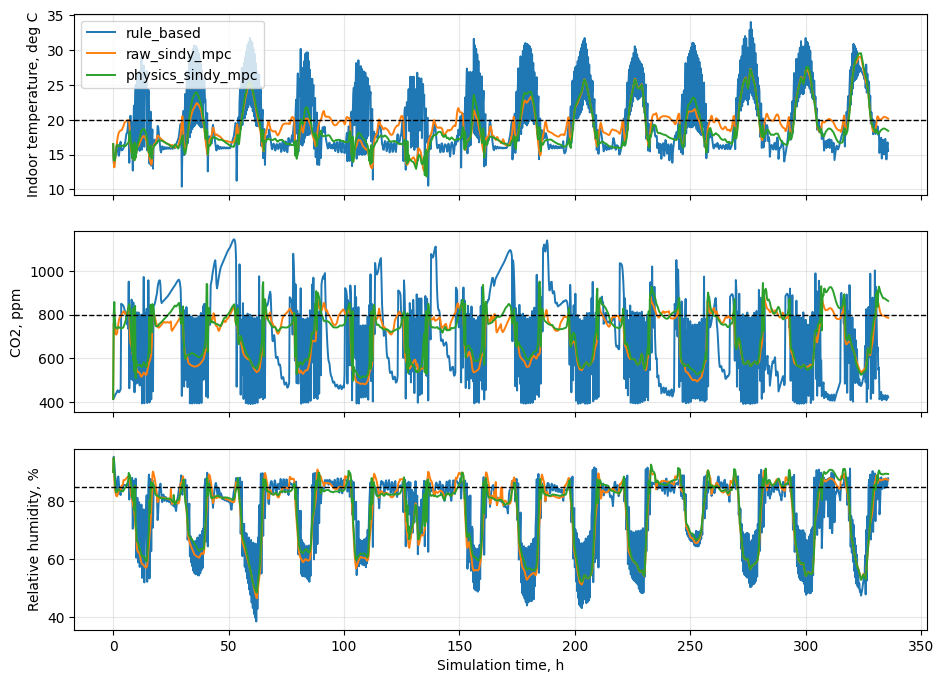

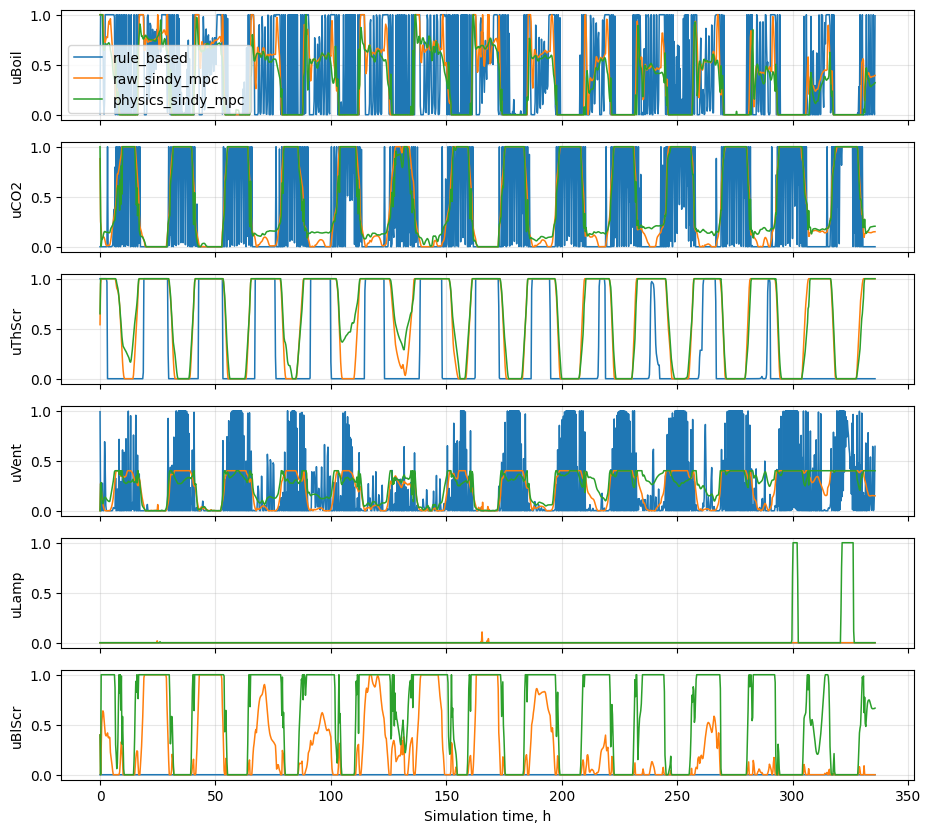

In [5]:
metrics = benchmark_rollouts(rollouts)
save_table(metrics, OUT / 'tables' / ('closed_loop_benchmark_fast.csv' if FAST_MODE else 'closed_loop_benchmark.csv'))
plot_rollout_comparison(rollouts, OUT / 'figures', suffix='_fast' if FAST_MODE else '')
metrics

## Inference latency benchmark

Measures one-step prediction time for SINDy surrogates (Table: Computational Efficiency in paper).

In [ ]:
import time, numpy as np

# Load test data
test_path = OUT / 'datasets' / 'rbc_test_30d_2010_04_15.npz'
if not test_path.exists():
    cfg_test = ExperimentConfig(n_days=30, start_date='2010-04-15')
    test_data_t = collect_rule_based_dataset(cfg_test, n_days=30, start_date='2010-04-15')
    save_dataset(test_data_t, test_path)
else:
    test_data_t = load_dataset(test_path)

sindy_bundles_t = {'raw_sindy': raw_bundle, 'physics_sindy': pi_bundle}
if 'dagger_bundle' in vars():
    sindy_bundles_t['physics_sindy_dagger'] = dagger_bundle
nn_bundles_t = {}
nn_path = OUT / 'models' / 'nn_mpc_physics.pkl'
if nn_path.exists():
    nn_bundles_t['nn_mpc'] = load_bundle(nn_path)

timing_df = measure_inference_time(sindy_bundles_t, nn_bundles_t, test_data_t, n_samples=1000)
save_table(timing_df, OUT / 'tables' / 'inference_timing.csv')
timing_df.round(4)

In [ ]:
from article_experiment_utils import WeatherForecastTVP, build_mpc_controller
import pandas as pd, numpy as np, time

def time_mpc_steps(bundle, cfg, n_steps=30, start_date='2010-04-15'):
    wp = WeatherForecastTVP(cfg, n_days=3, start_date=start_date)
    mpc_ctrl = build_mpc_controller(bundle, wp, cfg, objective='full')
    import gl_gym  # noqa
    import gymnasium as gym
    env = gym.make(cfg.env_id, normalize_actions=False,
                   observation_modules=['IndoorClimateObservations','WeatherObservations','BasicCropObservations'],
                   season_length=3)
    scenario = weather_scenario_from_date(start_date, cfg.location)
    obs, _ = env.reset(options={'scenario': scenario}, seed=cfg.seed)
    st, _ = observation_to_arrays(obs)
    mpc_ctrl.x0 = st.reshape(-1, 1)
    mpc_ctrl.set_initial_guess()
    times = []
    for _ in range(n_steps):
        s, _ = observation_to_arrays(obs)
        t0 = time.perf_counter()
        try:
            act = np.asarray(mpc_ctrl.make_step(s.reshape(-1, 1))).ravel().clip(0,1)
        except Exception:
            break
        times.append((time.perf_counter() - t0) * 1e3)
        obs, _, done, trunc, _ = env.step(act.astype('float32'))
        if done or trunc:
            break
    env.close()
    return times

mpc_timing_rows = []
for label, bundle in [('raw_sindy_mpc', raw_bundle), ('physics_sindy_mpc', pi_bundle)]:
    ts = np.array(time_mpc_steps(bundle, cfg))
    if len(ts):
        mpc_timing_rows.append({
            'method': label, 'n_steps': len(ts),
            'mean_ms': float(ts.mean()), 'std_ms': float(ts.std()),
            'median_ms': float(np.median(ts)), 'p95_ms': float(np.percentile(ts, 95)),
        })

mpc_timing_df = pd.DataFrame(mpc_timing_rows)
save_table(mpc_timing_df, OUT / 'tables' / 'mpc_step_timing.csv')
mpc_timing_df.round(2)

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(11, 4))

ax = axes[0]
colors_a = ['#2196F3' if t == 'SINDy' else '#FF9800'
            for t in timing_df.get('surrogate_type', ['SINDy'] * len(timing_df))]
ax.barh(timing_df['method'], timing_df['mean_ms'], xerr=timing_df['std_ms'],
        color=colors_a, capsize=4, edgecolor='black', linewidth=0.6)
ax.set_xlabel('One-step inference time (ms)')
ax.set_title('(A) Surrogate prediction latency')
ax.grid(True, axis='x', alpha=0.3)

ax = axes[1]
ax.barh(mpc_timing_df['method'], mpc_timing_df['mean_ms'], xerr=mpc_timing_df['std_ms'],
        color='#4CAF50', capsize=4, edgecolor='black', linewidth=0.6)
ax.set_xlabel('MPC make_step time (ms)')
ax.set_title('(B) MPC solver step latency (CasADi+IPOPT)')
ax.grid(True, axis='x', alpha=0.3)

fig.suptitle('Computational efficiency', fontsize=12)
fig.tight_layout()
save_figure(fig, OUT / 'figures' / 'computational_efficiency.png')
plt.show()

nz = int(__import__('numpy').count_nonzero(pi_bundle.model.coefficients()))
total = int(pi_bundle.model.coefficients().size)
print(f'SINDy (physics) params: {nz} nonzero / {total} total  (sparsity {1-nz/total:.1%})')
print(f'MPC horizon: {cfg.horizon} steps')

For the paper, the most useful columns are:

- `temp_rmse`, `co2_rmse`, `rh_excess_area` for tracking and climate quality.
- `temp_low_violations`, `temp_high_violations`, `temp_safe_pct` for safety constraints.
- `energy_proxy_sum`, `boiler_sum`, `lamp_sum`, `co2_injection_sum` for resource use.
- `comfort_pct` as a compact operational metric.